# GIU Clustering Project

Objective
The objective of this project teach students how to apply clustering to real data sets
the projects aims to teach student
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional)
* How to evaluate clustering approachs
* How to display the output
* What is the effect of normalizing the data
* what is the effect of using PCA
Students in this project will use readymade functions from Sklearn, plotnine, numpy and panadas




In [ ]:
# if plotnine is not installed in Jupter then use the following command to install it


Running this project require the following imports

In [4]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data
# You may also check MinMaxScaler and MaxAbsScaler
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [6]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set
* The Data Set generated below has 6 cluster with variying number of users and varing densities
* cluster the data set below using



## Multi Blob Data Set
* The Data Set generated below has 6 cluster with variying number of users and varing densities
* cluster the data set below using



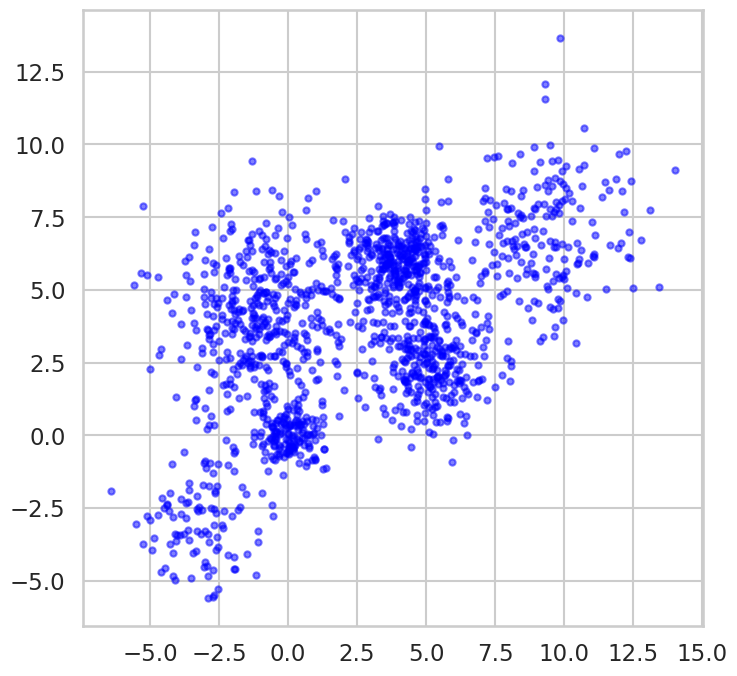

In [5]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

## Moons Data Set

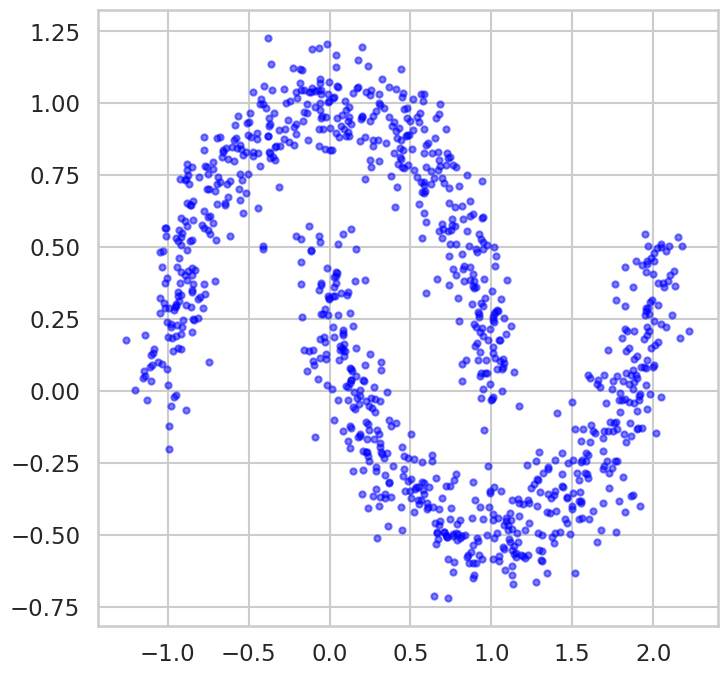

In [7]:
from sklearn.datasets import make_moons
n_samples = 1000
X, y = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
display_cluster(X)


### Kmeans
* use kmeans with different values of K to cluster the above data (multi Bloob abd moons)
* Display the outcome of each value of K
* Plot distoration function versus K and choose the approriate value of k
* plot the silhouette_score versus K and use to choose the best K
* store the silhouette_score for the best K for later comparison with other clustering techniques.
* Perform a PCA analysis and repeat the clustering in the for the transformed domain
* transfor the data back to the original domain and plot the data  

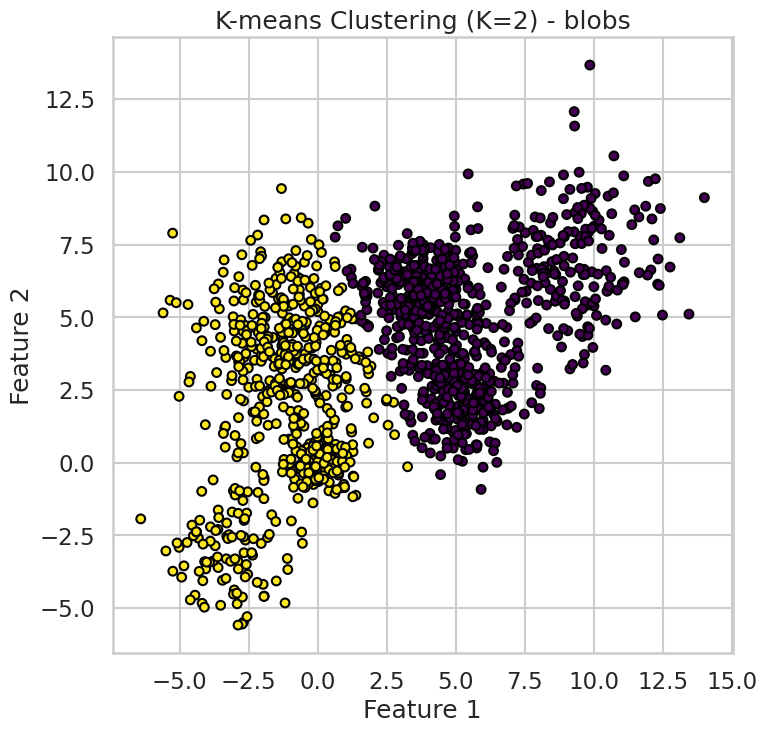

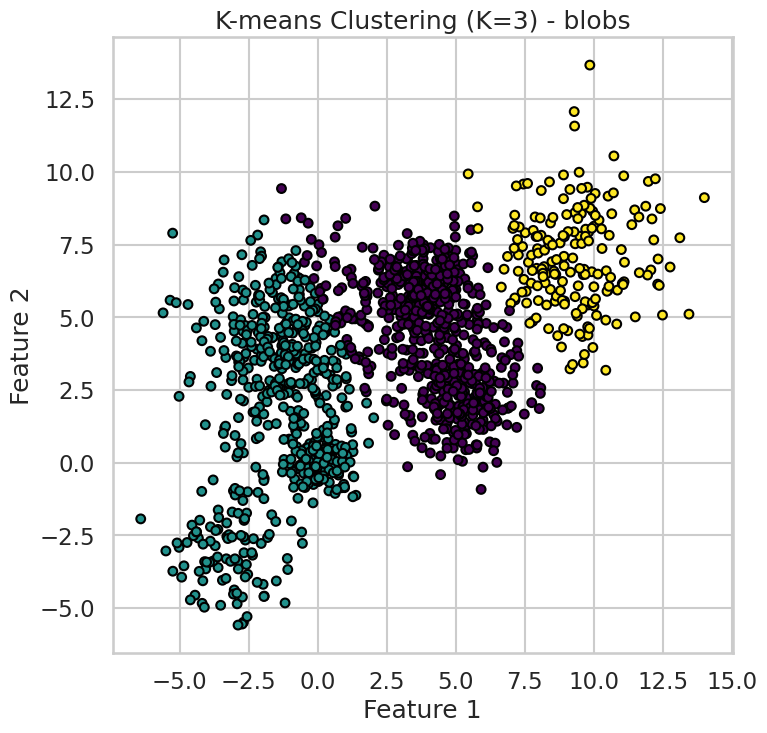

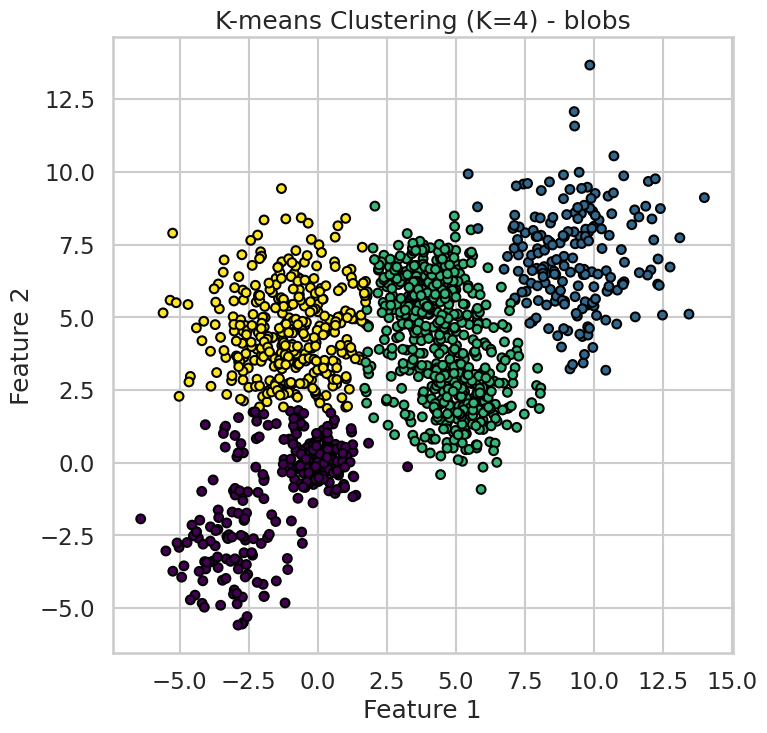

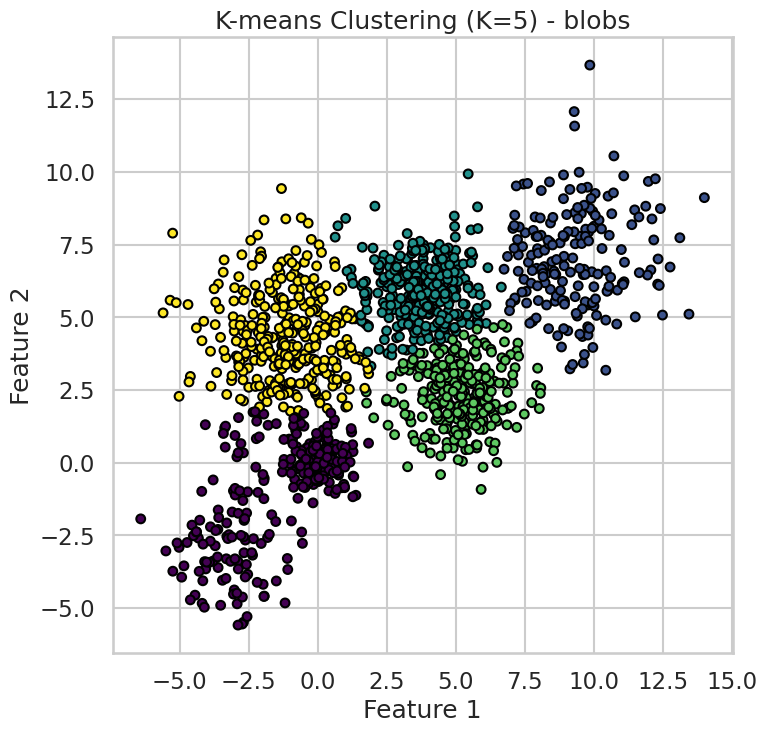

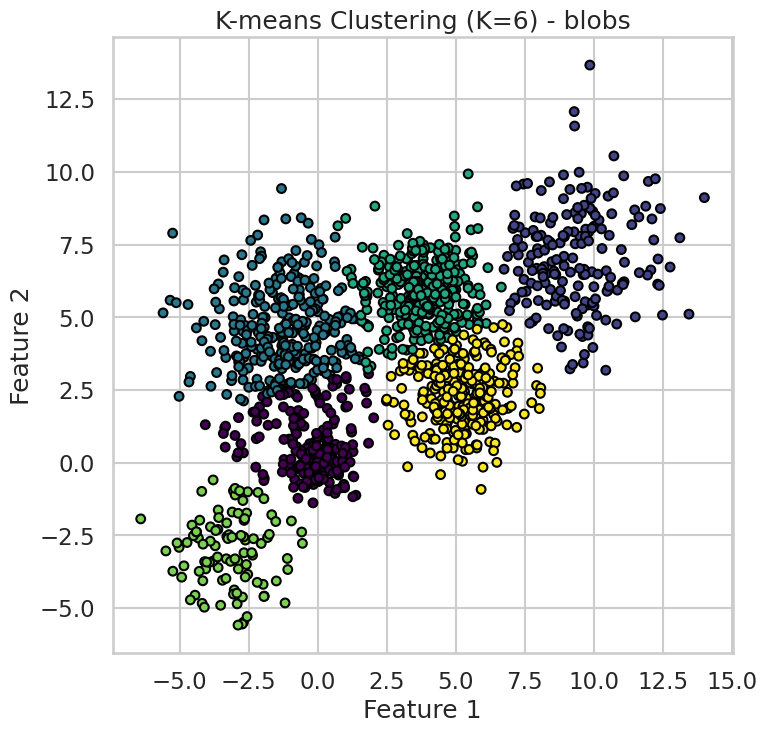

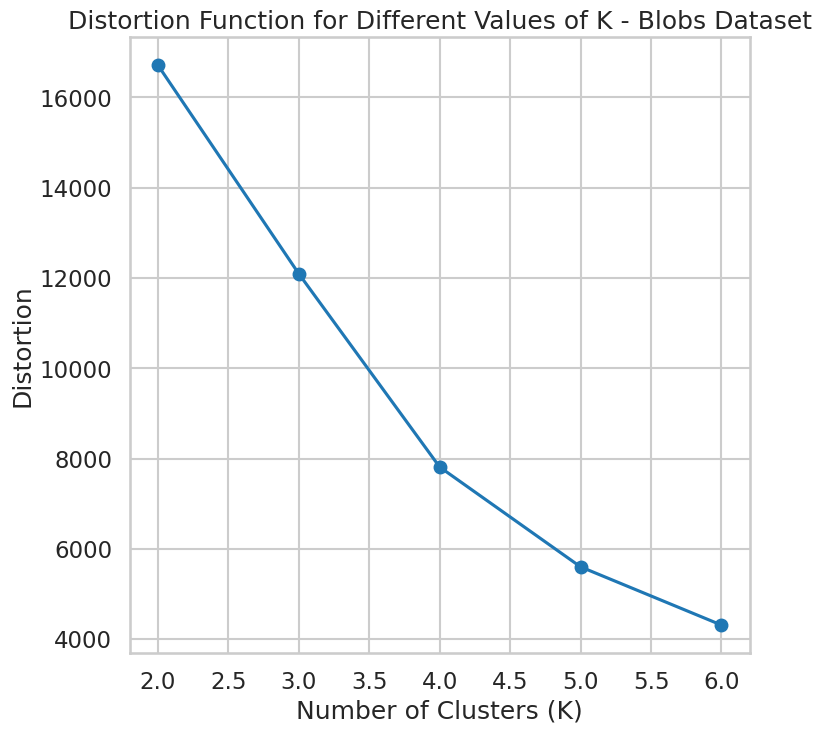

Best K for Blobs dataset: 6


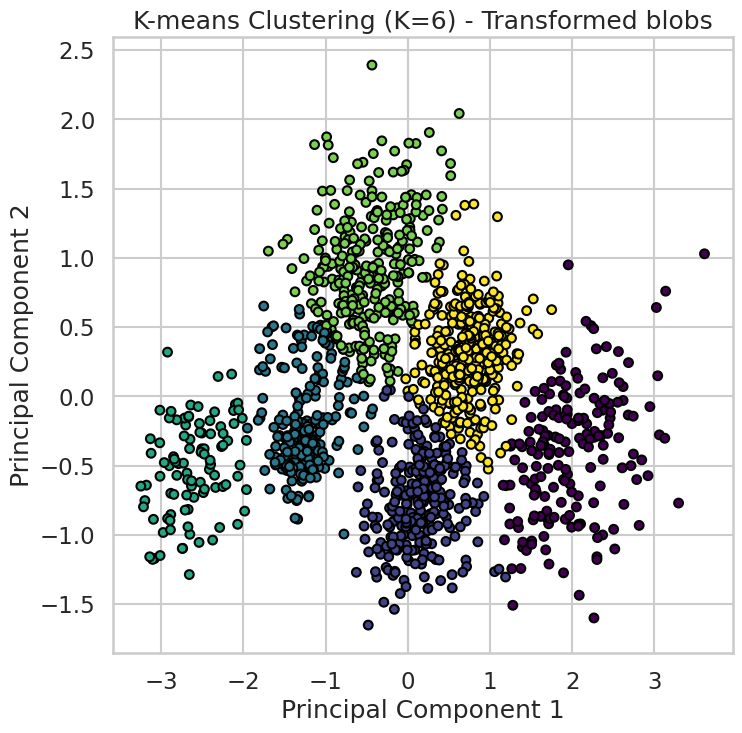

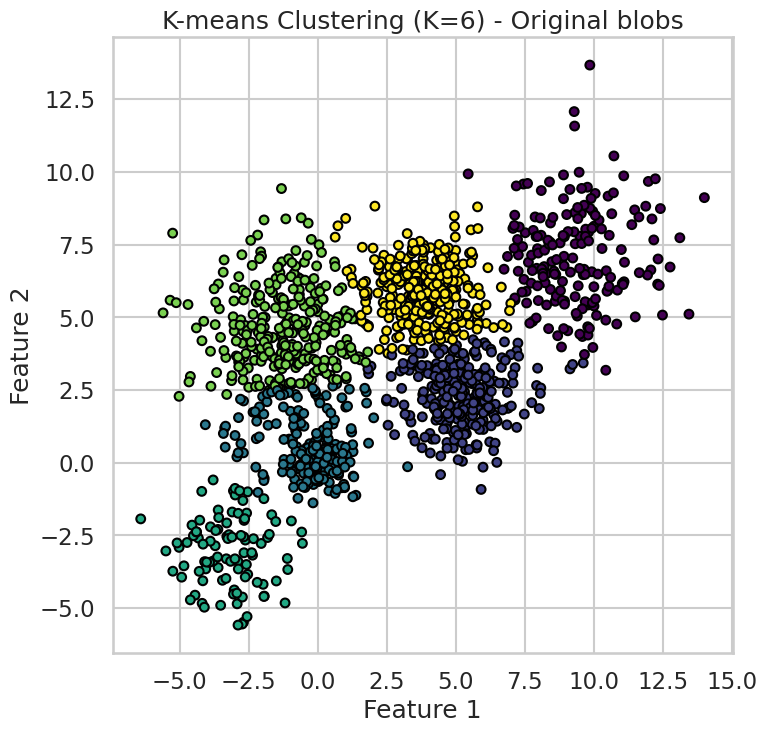

In [96]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Function to perform K-means clustering and visualize the results
def kmeans_clustering(data, k, dataset_name):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data)
    labels = kmeans.labels_

    # Visualize the clusters
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', edgecolor='k', s=40)
    plt.title(f'K-means Clustering (K={k}) - {dataset_name}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

    # Calculate distortion and silhouette score
    distortion = kmeans.inertia_
    silhouette = silhouette_score(data, labels)

    return labels, distortion, silhouette

# Function to perform PCA analysis and clustering in the transformed domain
def perform_pca_and_clustering(data, k, dataset_name):
    # Standardize the data
    scaler = StandardScaler()
    data_standardized = scaler.fit_transform(data)

    # Apply PCA
    pca = PCA(n_components=2)
    data_transformed = pca.fit_transform(data_standardized)

    # Perform K-means clustering on the transformed data
    kmeans_transformed = KMeans(n_clusters=k, random_state=42)
    kmeans_transformed.fit(data_transformed)
    labels_transformed = kmeans_transformed.labels_

    # Visualize the clusters in the transformed domain
    plt.scatter(data_transformed[:, 0], data_transformed[:, 1], c=labels_transformed, cmap='viridis', edgecolor='k', s=40)
    plt.title(f'K-means Clustering (K={k}) - Transformed {dataset_name}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.show()

    # Transform the data back to the original domain
    data_back = pca.inverse_transform(data_transformed)

    # Visualize the original data and clustered points
    plt.scatter(data[:, 0], data[:, 1], c=labels_transformed, cmap='viridis', edgecolor='k', s=40)
    plt.title(f'K-means Clustering (K={k}) - Original {dataset_name}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

# Generate make_blobs dataset
n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
blobs_data, _ = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)

# Perform K-means clustering for different values of K for make_blobs dataset
k_values = [2, 3, 4, 5, 6]
silhouette_scores_kmeans_blobs = []
distortions_blobs = []

for k in k_values:
    _, distortion, silhouette = kmeans_clustering(blobs_data, k, 'blobs')
    silhouette_scores_kmeans_blobs.append(silhouette)
    distortions_blobs.append(distortion)

# Plot distortion function for different values of K for make_blobs dataset
plt.plot(k_values, distortions_blobs, marker='o')
plt.title('Distortion Function for Different Values of K - Blobs Dataset')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.show()

# Find the best K for make_blobs dataset
best_k_blobs = k_values[np.argmax(silhouette_scores_kmeans_blobs)]
print("Best K for Blobs dataset:", best_k_blobs)

# Perform PCA analysis and repeat clustering for the transformed domain
perform_pca_and_clustering(blobs_data, best_k_blobs, 'blobs')


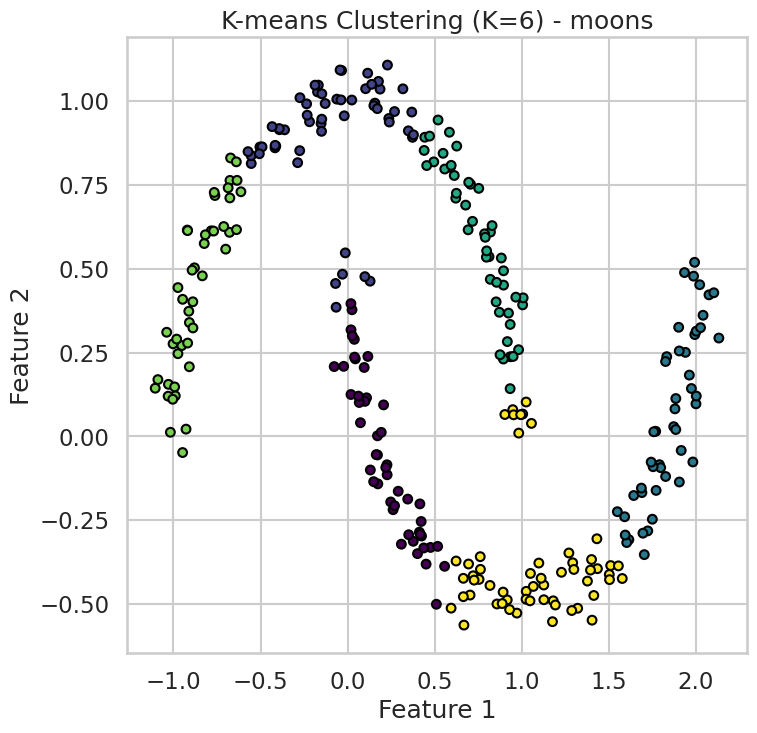

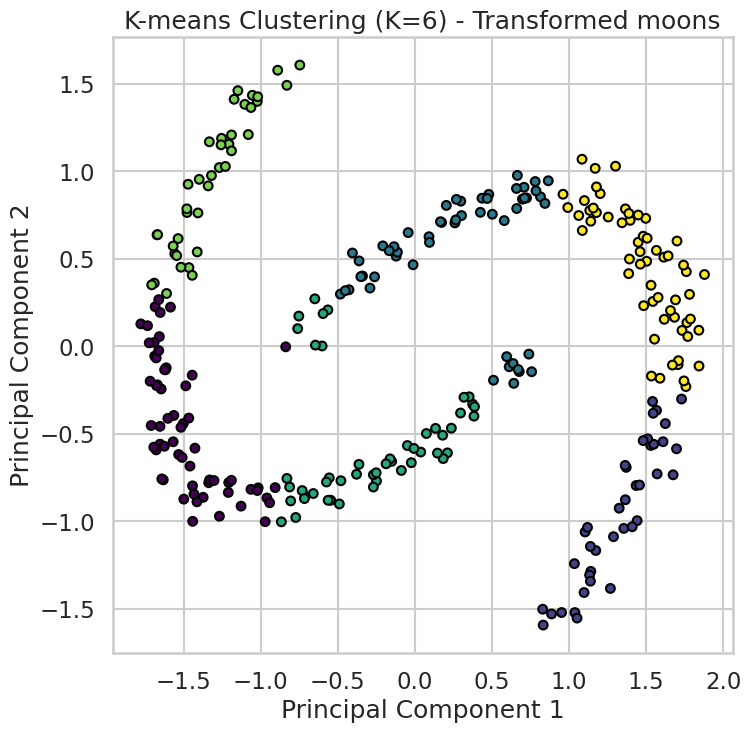

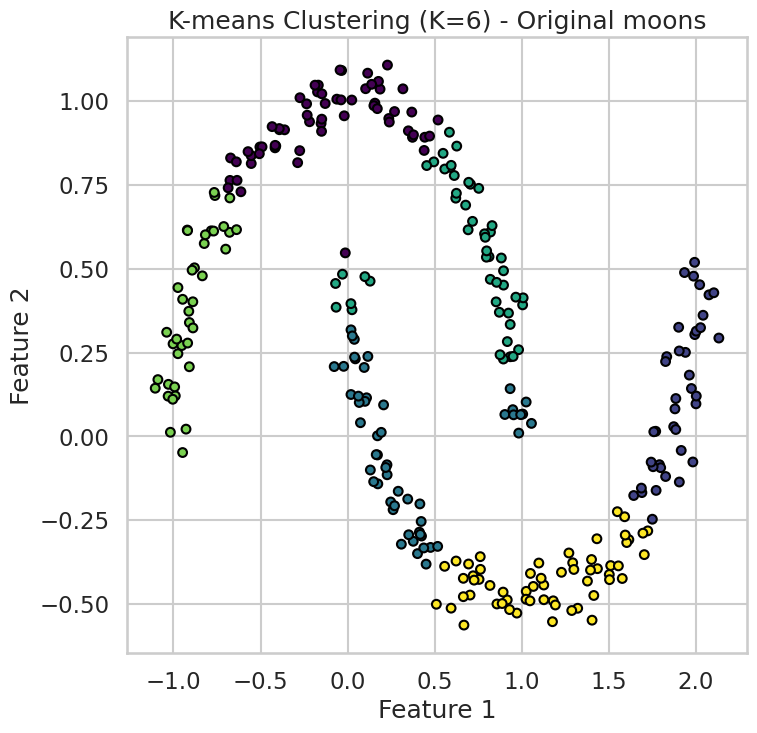

In [97]:
# ... (previous imports)

# Function to perform K-means clustering and visualize the results for moon dataset
def kmeans_clustering_moons(data, k, dataset_name):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data)
    labels = kmeans.labels_

    # Visualize the clusters
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', edgecolor='k', s=40)
    plt.title(f'K-means Clustering (K={k}) - {dataset_name}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

    # Calculate distortion and silhouette score
    distortion = kmeans.inertia_
    silhouette = silhouette_score(data, labels)

    return labels, distortion, silhouette

# Function to perform PCA analysis and clustering in the transformed domain for moon dataset
def perform_pca_and_clustering_moons(data, k, dataset_name):
    # Standardize the data
    scaler = StandardScaler()
    data_standardized = scaler.fit_transform(data)

    # Apply PCA
    pca = PCA(n_components=2)
    data_transformed = pca.fit_transform(data_standardized)

    # Perform K-means clustering on the transformed data
    kmeans_transformed = KMeans(n_clusters=k, random_state=42)
    kmeans_transformed.fit(data_transformed)
    labels_transformed = kmeans_transformed.labels_

    # Visualize the clusters in the transformed domain
    plt.scatter(data_transformed[:, 0], data_transformed[:, 1], c=labels_transformed, cmap='viridis', edgecolor='k', s=40)
    plt.title(f'K-means Clustering (K={k}) - Transformed {dataset_name}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.show()

    # Transform the data back to the original domain
    data_back = pca.inverse_transform(data_transformed)

    # Visualize the original data and clustered points
    plt.scatter(data[:, 0], data[:, 1], c=labels_transformed, cmap='viridis', edgecolor='k', s=40)
    plt.title(f'K-means Clustering (K={k}) - Original {dataset_name}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

# Generate moon dataset
moons_data, _ = make_moons(n_samples=300, noise=0.05, random_state=42)

# Perform K-means clustering for 6 clusters for moon dataset
k_value_moons = 6
_, _, _ = kmeans_clustering_moons(moons_data, k_value_moons, 'moons')

# Perform PCA analysis and repeat clustering for the transformed domain for moon dataset
perform_pca_and_clustering_moons(moons_data, k_value_moons, 'moons')


### Hierarchal
* use AgglomerativeClustering function to  to cluster the above data
* In the  AgglomerativeClustering change the following paramters
    * Affinity (use euclidean, “manhattan and cosine)
    * Linkage( use average and  single )
    * Distance_threshold (try different)
* for each of these trials plot the Dendograph , calculate the, silhouette_score and display the resulting clusters)  
* Find the set fo paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* record your observation

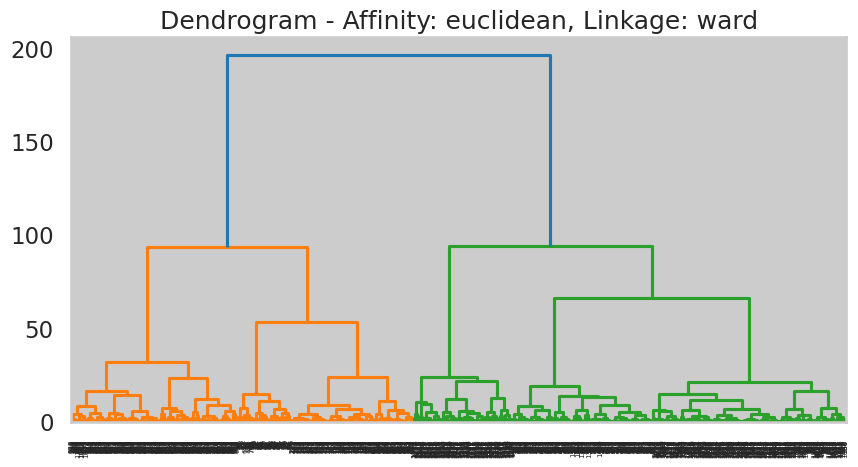

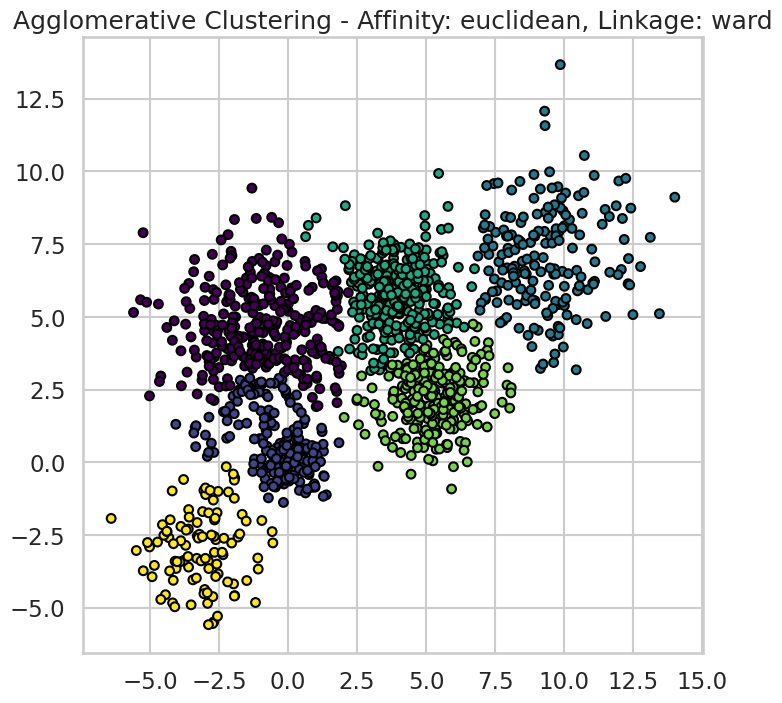

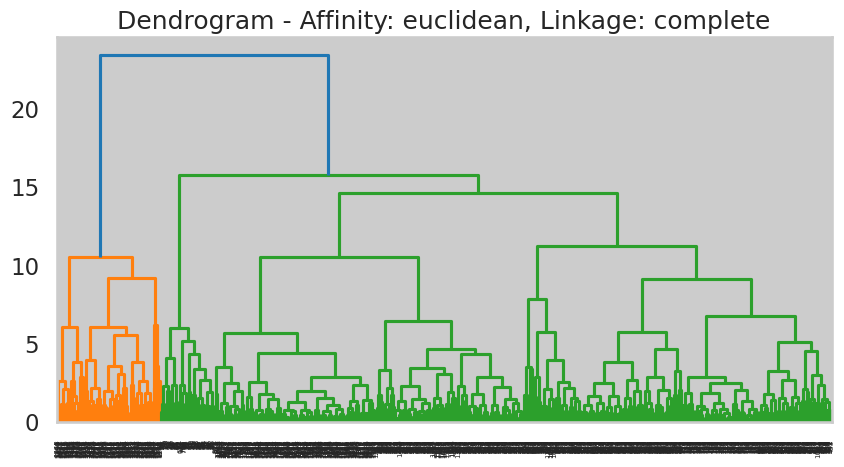

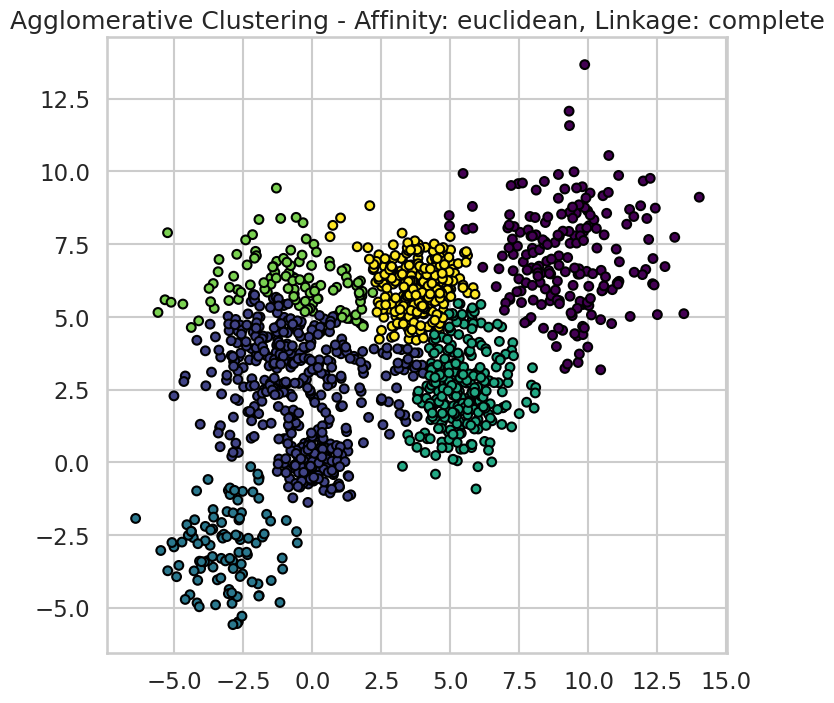

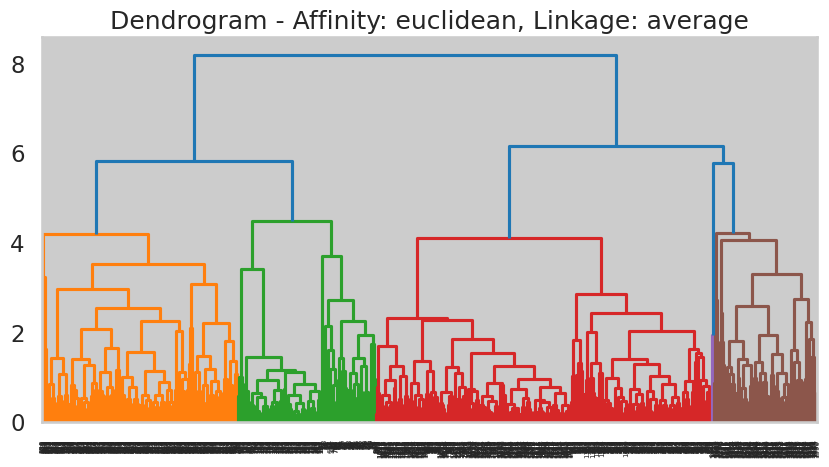

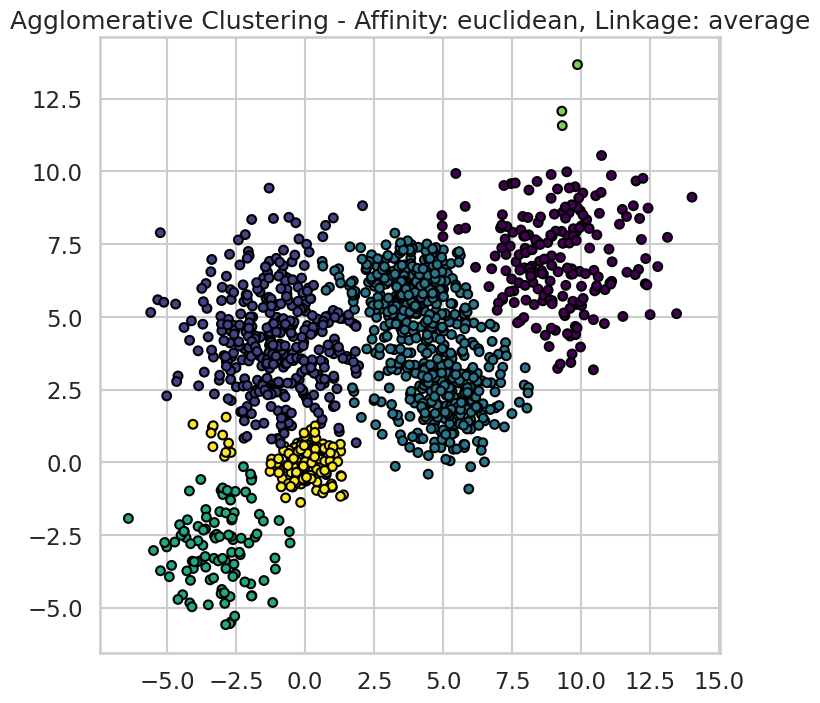

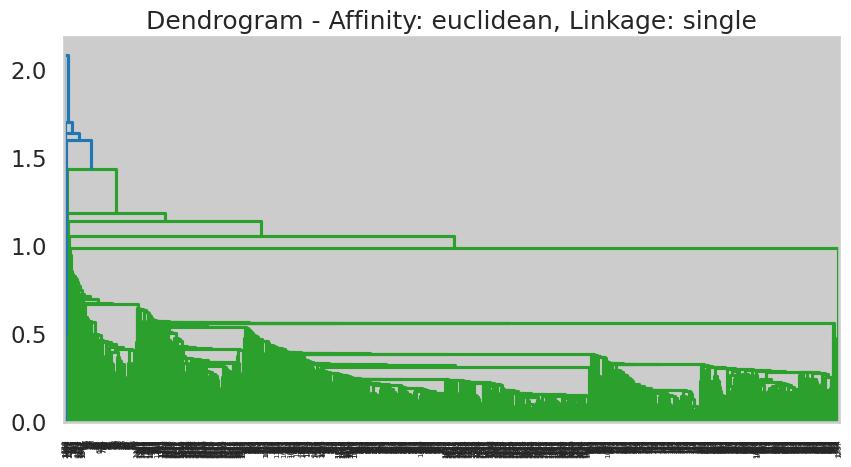

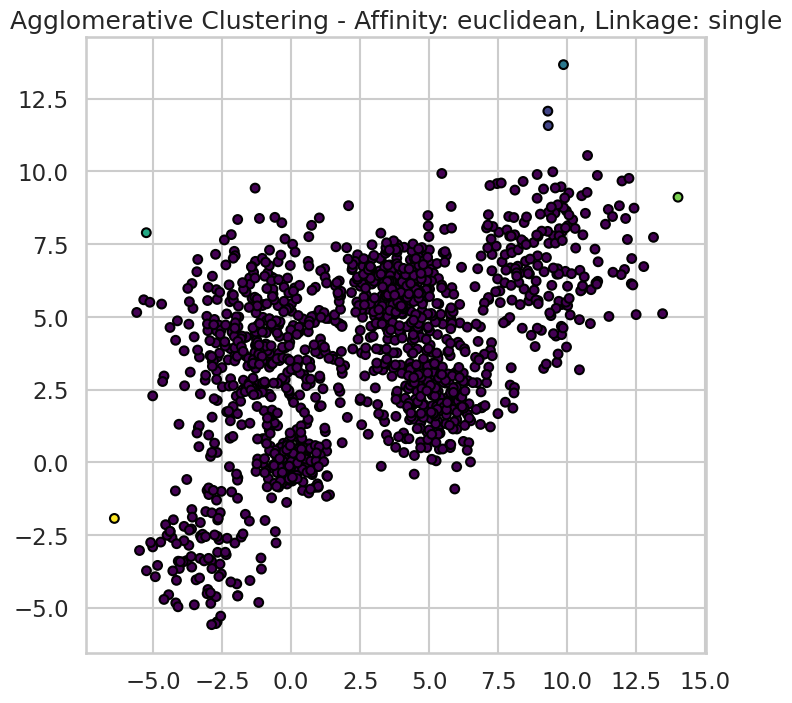

Best Parameters: {'linkage_method': 'ward', 'silhouette_score': 0.4686938472105883}


In [106]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Function for Agglomerative Clustering on make_blobs dataset
def agglomerative_clustering_blobs(data, affinity, linkage_method):
    # Using scikit-learn's AgglomerativeClustering
    model = AgglomerativeClustering(affinity=affinity, linkage=linkage_method, n_clusters=6)
    labels = model.fit_predict(data)

    # Calculate silhouette score
    silhouette = silhouette_score(data, labels)

    # Plot Dendrogram
    Z = linkage(data, method=linkage_method)
    plt.figure(figsize=(10, 5))
    dendrogram(Z)
    plt.title(f'Dendrogram - Affinity: {affinity}, Linkage: {linkage_method}')
    plt.show()

    # Display resulting clusters
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', edgecolor='k', s=40)
    plt.title(f'Agglomerative Clustering - Affinity: {affinity}, Linkage: {linkage_method}')
    plt.show()

    return silhouette

# Example usage
affinity = 'euclidean'
linkages = ['ward', 'complete', 'average', 'single']

best_silhouette_score = -1

for linkage_method in linkages:
    silhouette = agglomerative_clustering_blobs(blobs_data, affinity, linkage_method)

    # Update best parameters if silhouette score improves
    if silhouette > best_silhouette_score:
        best_silhouette_score = silhouette
        best_parameters = {
            'linkage_method': linkage_method,
            'silhouette_score': silhouette
        }

# Display the best parameters
print("Best Parameters:", best_parameters)


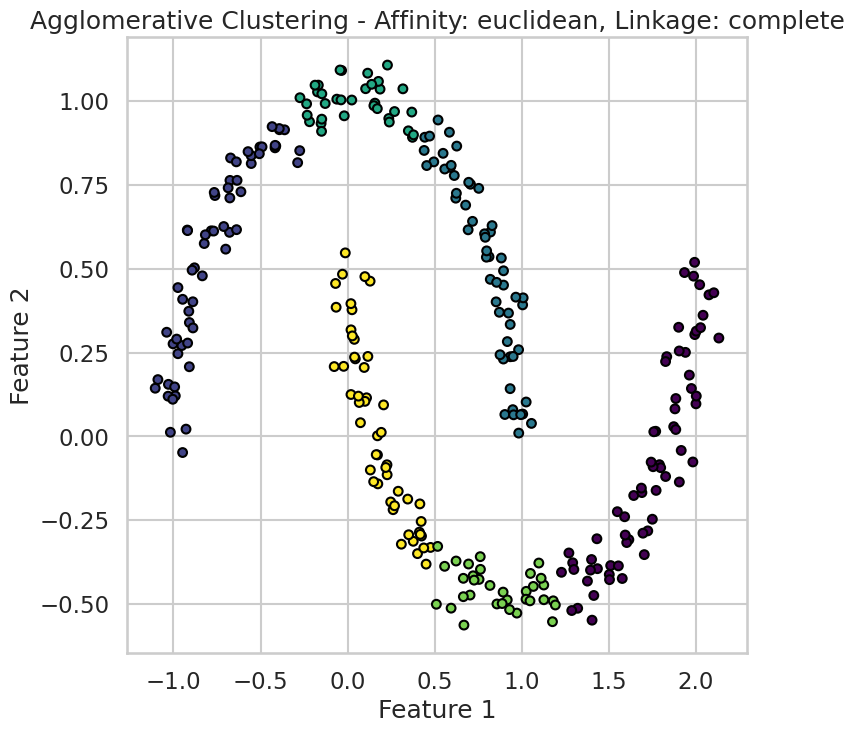

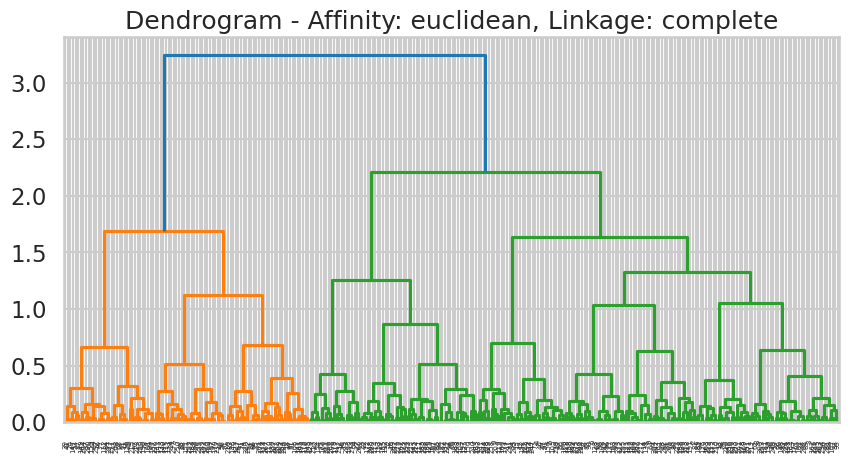

Silhouette Score: 0.47042709684216183


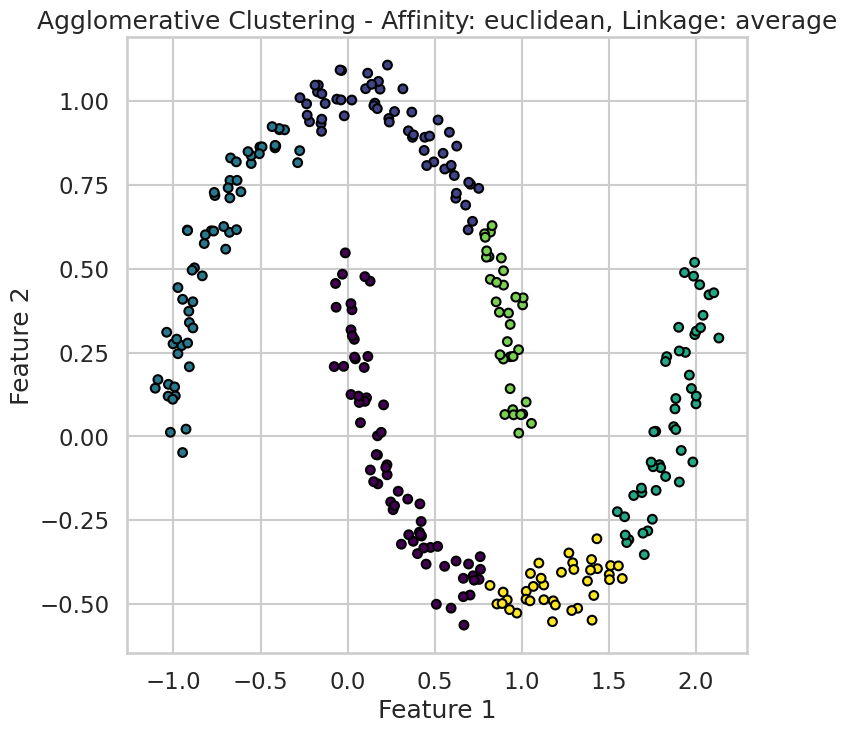

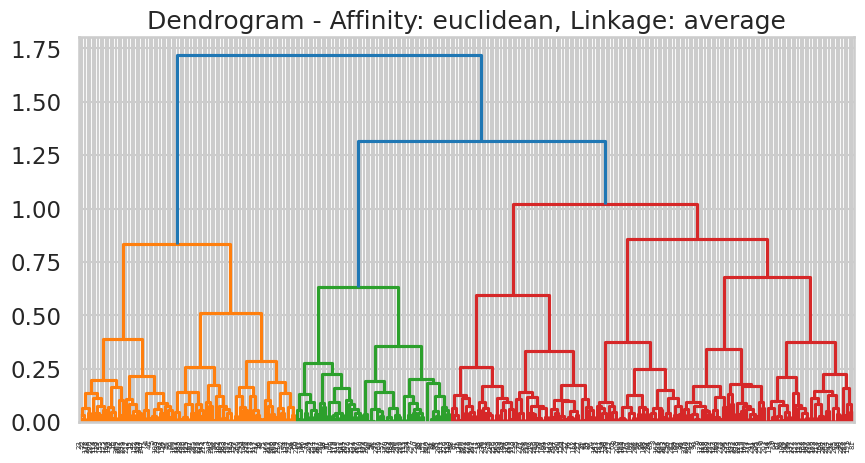

Silhouette Score: 0.4857469814565257


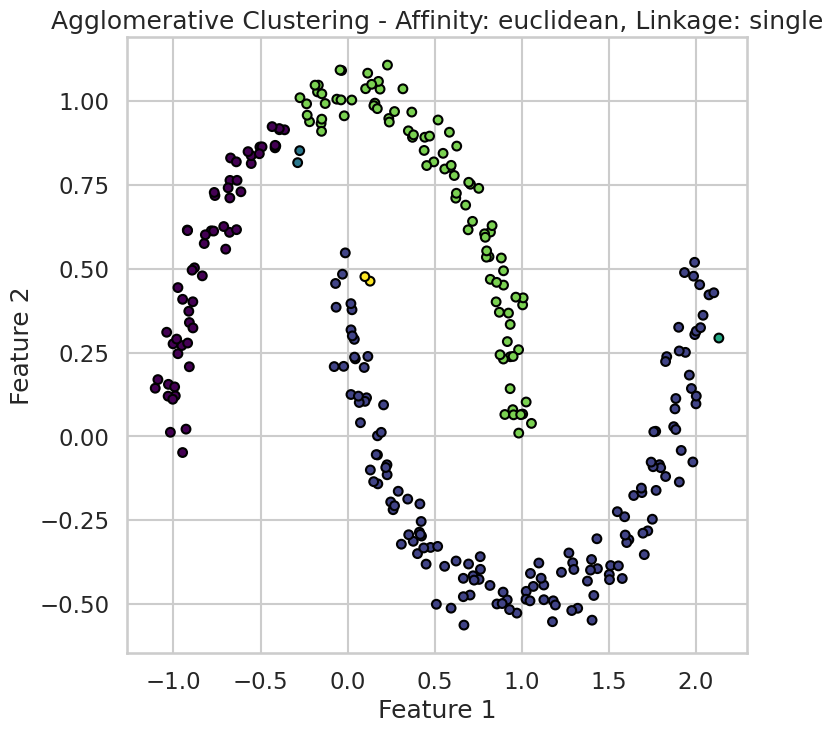

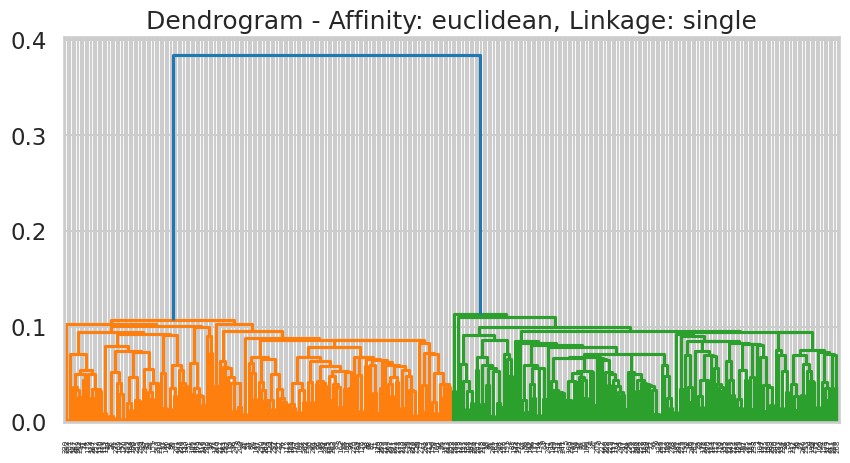

Silhouette Score: -0.07959663246113674


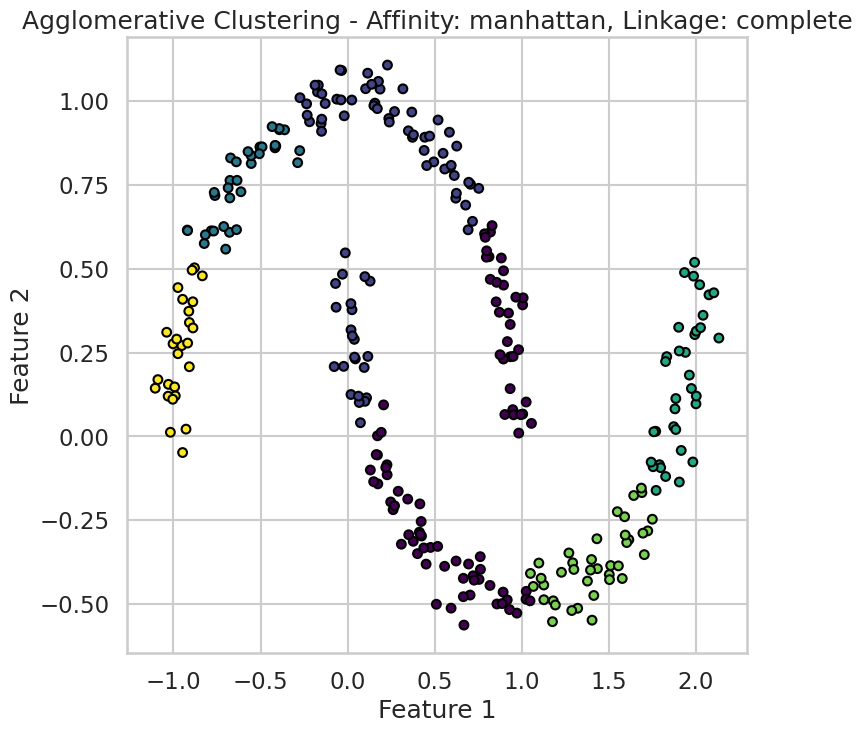

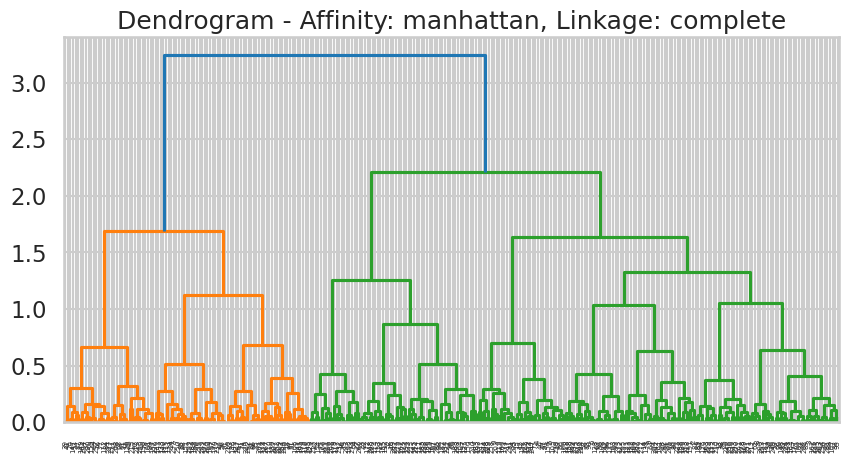

Silhouette Score: 0.3947276680647


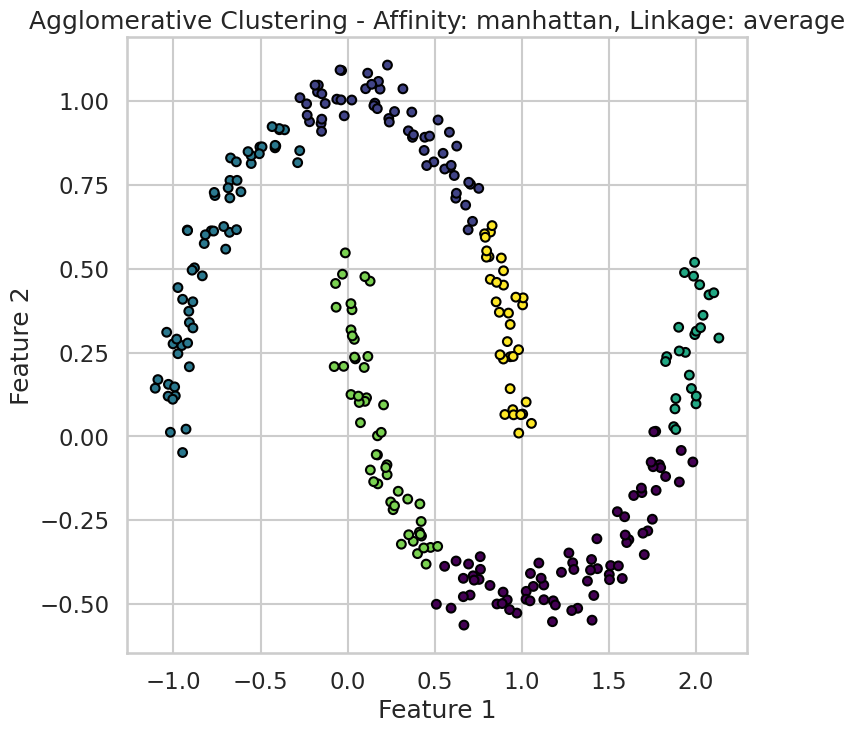

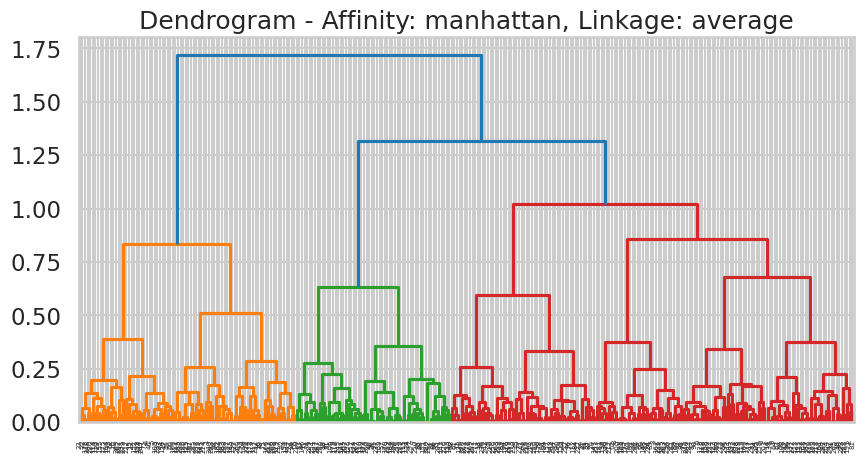

Silhouette Score: 0.4633579641261821


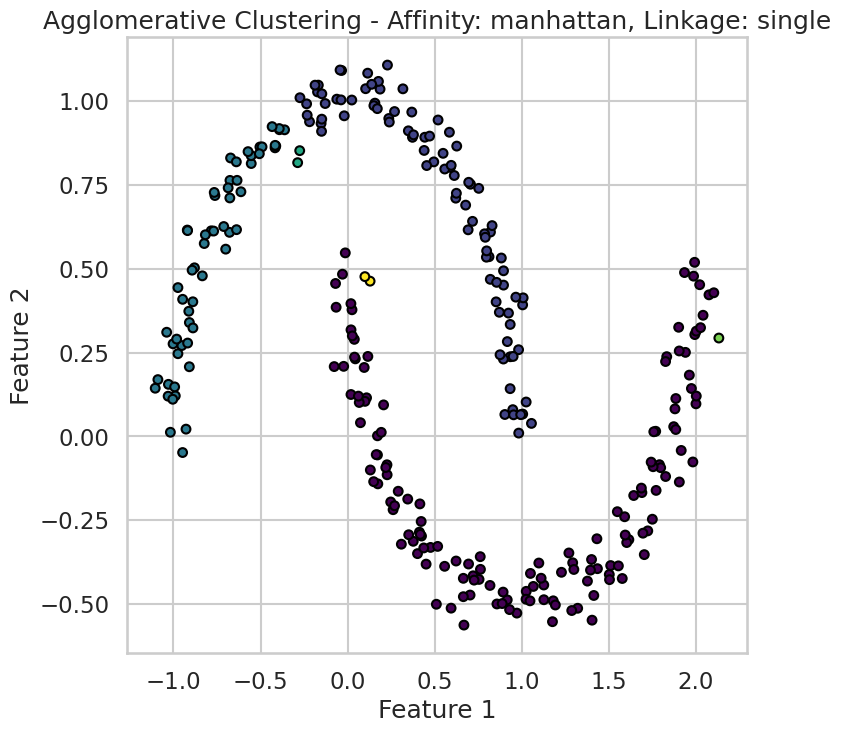

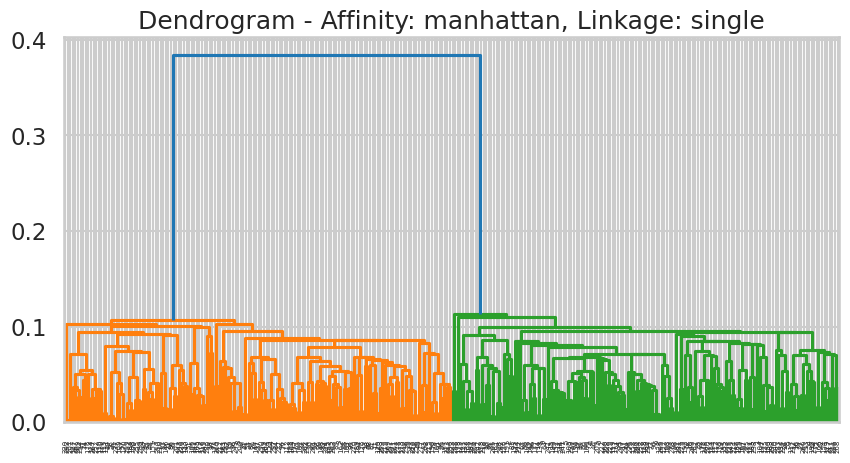

Silhouette Score: -0.07959663246113674


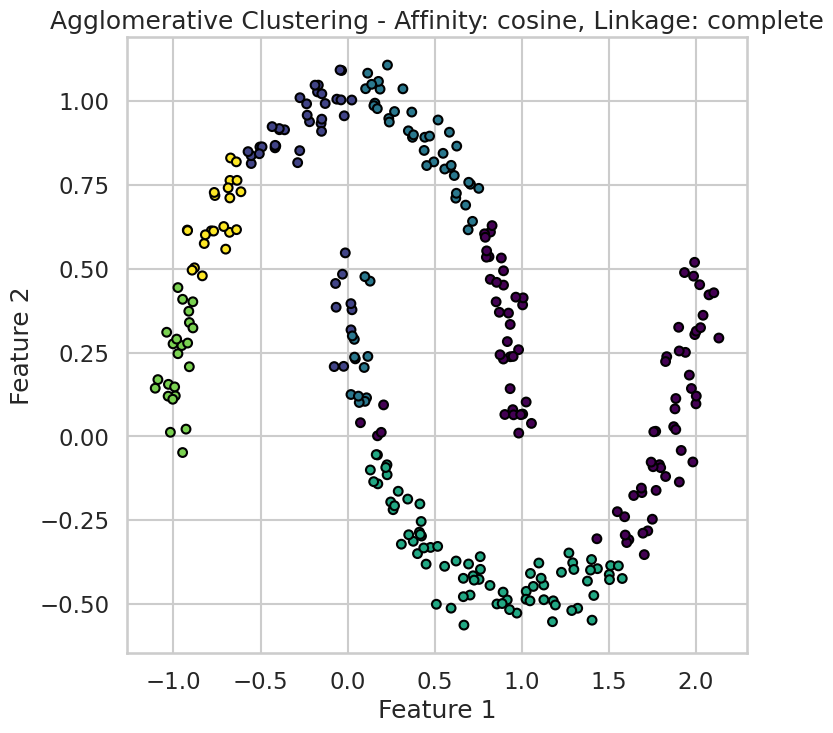

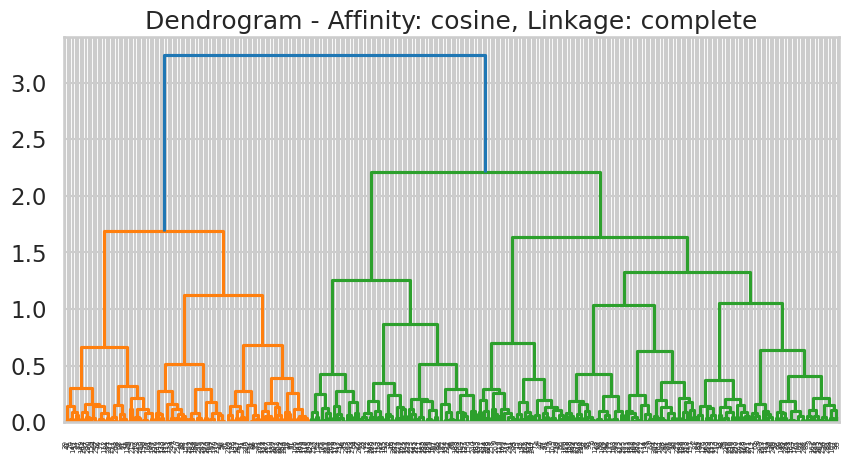

Silhouette Score: 0.3309129518164145


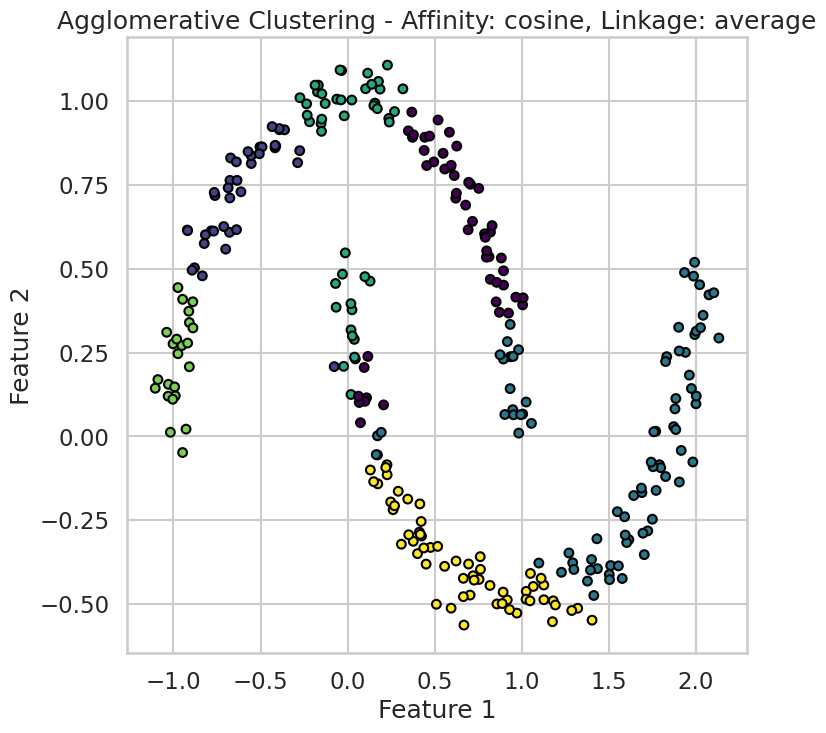

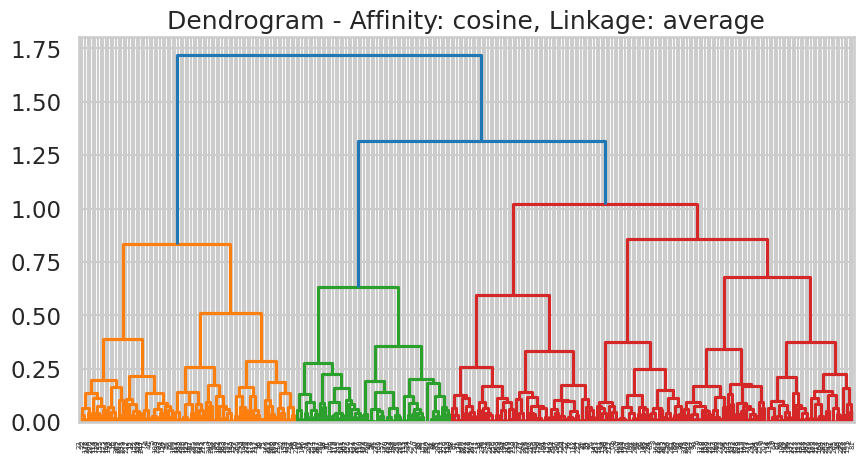

Silhouette Score: 0.3820276213661289


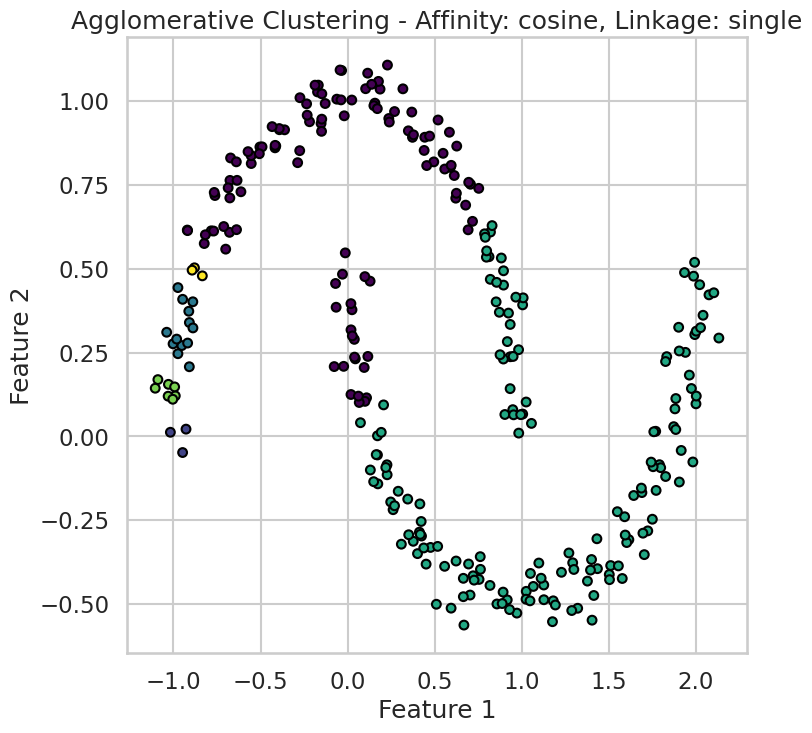

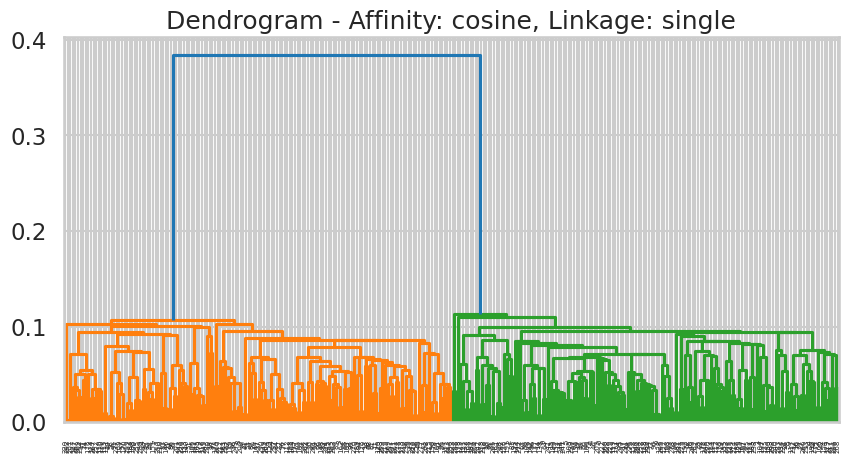

Silhouette Score: 0.3201260369095445
Best Parameters for make_moons dataset: {'affinity': 'euclidean', 'linkage_method': 'average', 'silhouette_score': 0.4857469814565257}


In [117]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_moons
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
import numpy as np

# Function for Agglomerative Clustering on make_moons dataset
def agglomerative_clustering_moons(data, affinity, linkage_method):
    n_clusters = 6  # Set the number of clusters

    # Exclude "ward" linkage for all affinities
    if linkage_method == 'ward':
        return None

    # Using scikit-learn's AgglomerativeClustering
    model = AgglomerativeClustering(affinity=affinity, linkage=linkage_method, n_clusters=n_clusters)
    labels = model.fit_predict(data)

    # Visualize the clusters
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', edgecolor='k', s=40)
    plt.title(f'Agglomerative Clustering - Affinity: {affinity}, Linkage: {linkage_method}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

    # Visualize the dendrogram
    if linkage_method != 'ward':
        # Create a linkage matrix
        Z = linkage(data, method=linkage_method)

        plt.figure(figsize=(10, 5))
        dendrogram(Z)
        plt.title(f'Dendrogram - Affinity: {affinity}, Linkage: {linkage_method}')
        plt.show()

    # Calculate silhouette score
    silhouette = silhouette_score(data, labels)
    print(f'Silhouette Score: {silhouette}')

    return silhouette

# Generate make_moons dataset
moons_data, _ = make_moons(n_samples=300, noise=0.05, random_state=42)

# Try different affinities and linkages for Agglomerative Clustering on make_moons dataset
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['complete', 'average', 'single']

best_silhouette_score_moons = -1
best_params_moons = {}

for affinity in affinities:
    for linkage_method in linkages:
        silhouette = agglomerative_clustering_moons(moons_data, affinity, linkage_method)

        # Update best parameters if silhouette score improves
        if silhouette is not None and silhouette > best_silhouette_score_moons:
            best_silhouette_score_moons = silhouette
            best_params_moons = {
                'affinity': affinity,
                'linkage_method': linkage_method,
                'silhouette_score': silhouette
            }

# Display the best parameters for make_moons dataset
print("Best Parameters for make_moons dataset:", best_params_moons)


### DBScan
* use Dscan function to  to cluster the above data
* In the  DBscan change the following paramters
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* plot the silhouette_score versus the variation in the EPS and the min_samples
* plot the resulting Clusters in this case
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* record your observations and comments
* Perform a PCA analysis and repeat the clustering in the for the transformed domain
* transfor the data back to the original domain and plot the data

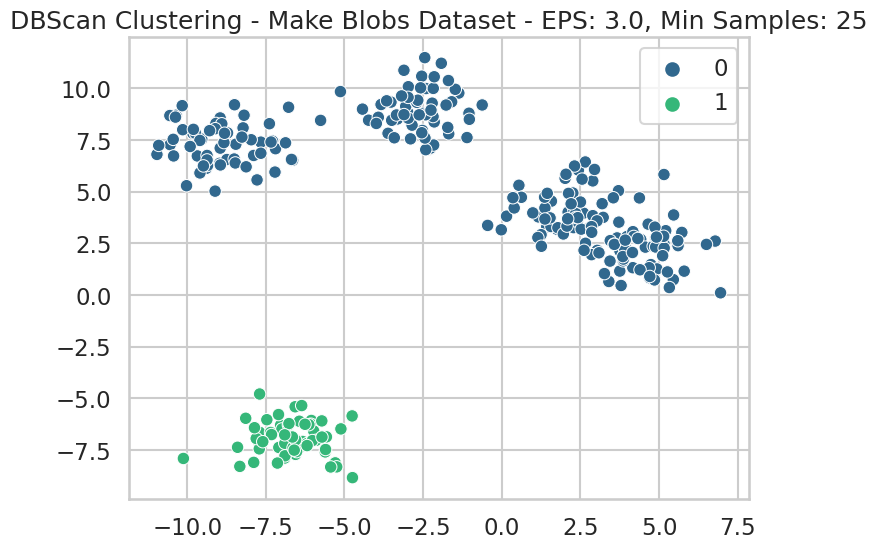

Best DBScan Parameters: EPS=3.0, Min Samples=25
Best Silhouette Score: 0.5973669752384221


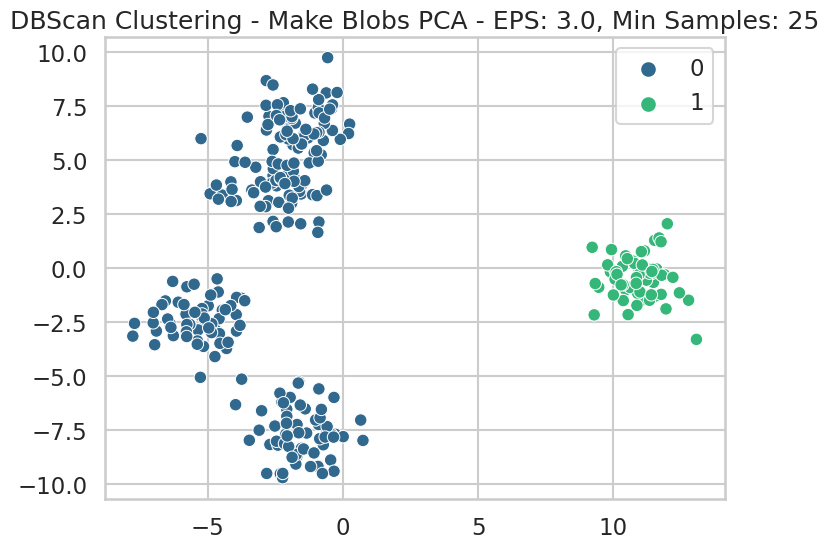

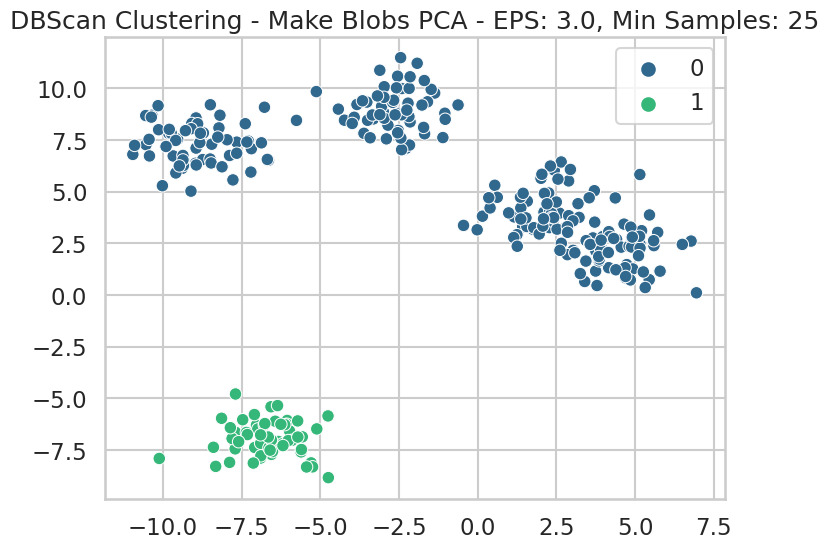

In [65]:
from sklearn.datasets import make_blobs
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Create a make_blobs dataset
blobs_data, blobs_labels = make_blobs(n_samples=300, centers=5, random_state=42)

# Function to perform DBScan clustering
def dbscan_clustering(data, eps, min_samples, dataset_name):
    # Apply DBScan clustering
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(data)

    # Evaluate clustering using silhouette score
    silhouette = silhouette_score(data, labels)

    # Display DBScan clusters
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=labels, palette='viridis', legend='full')
    plt.title(f'DBScan Clustering - {dataset_name} - EPS: {eps}, Min Samples: {min_samples}')
    plt.show()

    return silhouette, labels

# Vary EPS and Min_samples
eps_values = [3.0]
min_samples_values = [25]

best_silhouette_score = -1

for eps in eps_values:
    for min_samples in min_samples_values:
        silhouette, _ = dbscan_clustering(blobs_data, eps, min_samples, 'Make Blobs Dataset')

        # Update best parameters if silhouette score improves
        if silhouette > best_silhouette_score:
            best_silhouette_score = silhouette
            best_dbscan_params = {'eps': eps, 'min_samples': min_samples}

# Display the best DBScan parameters and silhouette score
print(f'Best DBScan Parameters: EPS={best_dbscan_params["eps"]}, Min Samples={best_dbscan_params["min_samples"]}')
print(f'Best Silhouette Score: {best_silhouette_score}')

# Apply PCA and repeat clustering for the transformed domain
pca = PCA(n_components=2)
data_pca = pca.fit_transform(blobs_data)

best_silhouette_score_pca, _ = dbscan_clustering(data_pca, best_dbscan_params['eps'], best_dbscan_params['min_samples'], 'Make Blobs PCA')

# Transform data back to the original domain and plot
data_original_domain = pca.inverse_transform(data_pca)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_original_domain[:, 0], y=data_original_domain[:, 1], hue=_, palette='viridis', legend='full')
plt.title(f'DBScan Clustering - Make Blobs PCA - EPS: {best_dbscan_params["eps"]}, Min Samples: {best_dbscan_params["min_samples"]}')
plt.show()


### Gaussian Mixture
* use GaussianMixture function to  to cluster the above data
* the GMM change the covariance_type and check the difference in the resulting proabability fit
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture
* Perform a PCA analysis and repeat the clustering in the for the transformed domain
* transfor the data back to the original domain and plot the data

In [85]:
def plot_gaussian_ellipse(mean, cov, color, alpha):
    v, w = np.linalg.eigh(cov)
    v = 2.0 * np.sqrt(2.0) * np.sqrt(v)

    if w.ndim == 1:
        u = w / np.linalg.norm(w)
    else:
        u = w[0] / np.linalg.norm(w[0])

    angle = np.arctan(u[1] / u[0]) if u.size > 1 else 0
    angle = 180.0 * angle / np.pi
    ell = mpl.patches.Ellipse(mean, v[0], v[1], 180.0 + angle, color=color, alpha=alpha)
    ell.set_clip_box(plt.gca().bbox)
    ell.set_alpha(alpha)
    plt.gca().add_patch(ell)


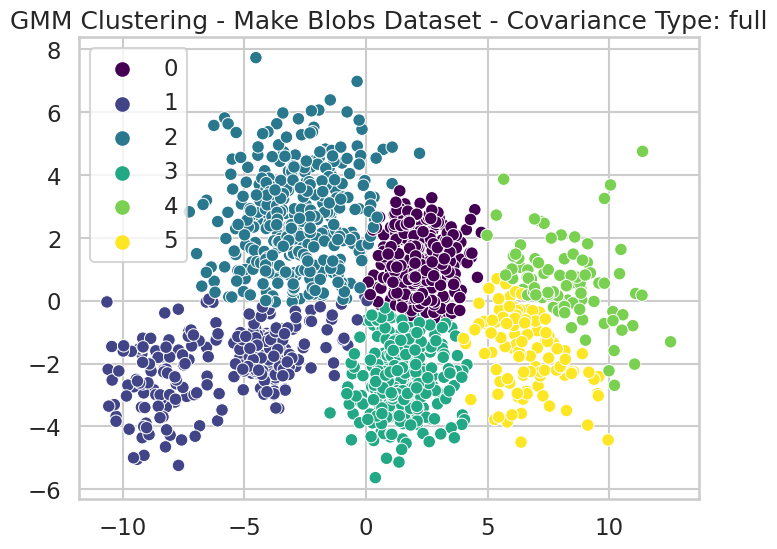

Silhouette Score (full): 0.44513443936241415


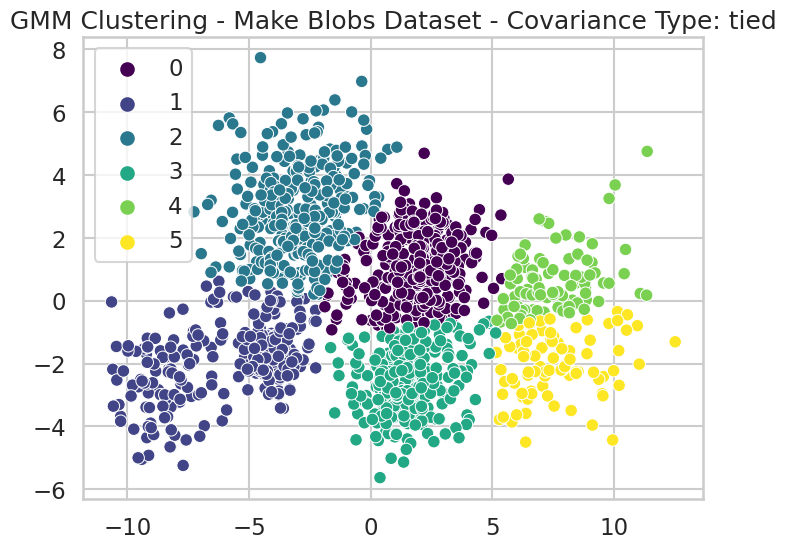

Silhouette Score (tied): 0.4419047609263477


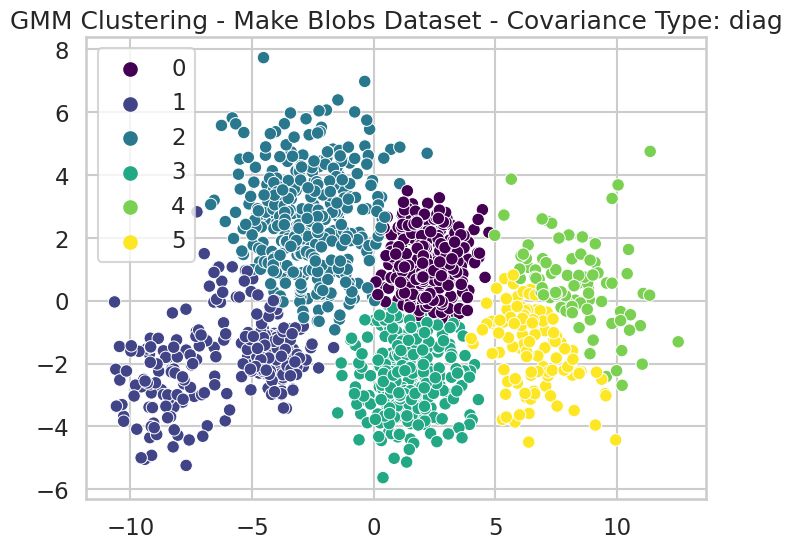

Silhouette Score (diag): 0.45358572472246456


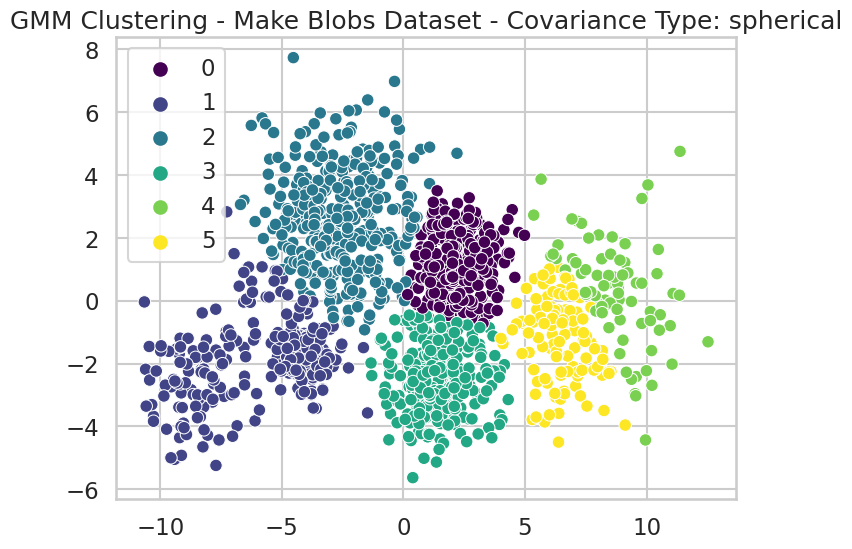

Silhouette Score (spherical): 0.4528823752874064


In [78]:
from sklearn.datasets import make_blobs
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to apply PCA and GMM clustering
def pca_and_gmm_clustering(data, n_components, covariance_types, dataset_name):
    # Apply PCA
    pca = PCA(n_components=2)
    data_pca = pca.fit_transform(data)

    best_silhouette_score = -1
    gmm_results = {}

    for covariance_type in covariance_types:
        # Apply Gaussian Mixture clustering
        gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
        labels = gmm.fit_predict(data)

        # Display GMM clusters
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=data_pca[:, 0], y=data_pca[:, 1], hue=labels, palette='viridis', legend='full')
        plt.title(f'GMM Clustering - {dataset_name} - Covariance Type: {covariance_type}')
        plt.show()

        # Evaluate clustering using silhouette score
        silhouette = silhouette_score(data, labels)
        print(f'Silhouette Score ({covariance_type}): {silhouette}')

        # Update results
        gmm_results[covariance_type] = {'model': gmm, 'silhouette_score': silhouette}

        # Update best parameters if silhouette score improves
        if silhouette > best_silhouette_score:
            best_silhouette_score = silhouette
            best_gmm_model = gmm

    return best_gmm_model, data_pca, gmm_results

# Generate make_blobs dataset
n_bins = 6
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]
Multi_blob_Data, _ = make_blobs(n_samples=[100, 150, 300, 400, 300, 200], n_features=2,
                                cluster_std=[1.3, 0.6, 1.2, 1.7, 0.9, 1.7],
                                centers=centers, shuffle=False, random_state=42)

# Apply PCA and GMM clustering to make_blobs dataset
n_components = 6  # Number of clusters in the dataset
covariance_types = ['full', 'tied', 'diag', 'spherical']
best_gmm_model_blobs, Multi_blob_Data_pca, gmm_results = pca_and_gmm_clustering(Multi_blob_Data, n_components, covariance_types, 'Make Blobs Dataset')


In [90]:
# Function to apply PCA and GMM clustering
def pca_and_gmm_clustering(data, n_components, covariance_types, dataset_name):
    print(f"Original data shape: {data.shape}")

    # Ensure the input data has at least two dimensions
    if data.ndim == 1:
        data = data.reshape(-1, 1)
        print(f"Reshaped data: {data.shape}")

    # Handle the case when n_components is greater than the minimum of n_samples and n_features
    n_components = min(n_components, min(data.shape))

    # Apply PCA
    pca = PCA(n_components=n_components)
    data_pca = pca.fit_transform(data)

    print(f"PCA-transformed data shape: {data_pca.shape}")

    best_silhouette_score = -1
    gmm_results = {}

    for covariance_type in covariance_types:
        # Apply Gaussian Mixture clustering
        gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
        labels = gmm.fit_predict(data)

        # Display GMM clusters
        plt.figure(figsize=(8, 6))
        plot_gaussian_ellipse(gmm.means_[0], gmm.covariances_[0], color='black', alpha=0.3)
        plot_gaussian_ellipse(gmm.means_[1], gmm.covariances_[1], color='black', alpha=0.3)
        sns.scatterplot(x=data_pca[:, 0], y=data_pca[:, 1], hue=labels, palette='viridis', legend='full', s=30, edgecolor='black')
        plt.title(f'GMM Clustering - {dataset_name} - Covariance Type: {covariance_type}')
        plt.show()

        # Evaluate clustering using silhouette score
        silhouette = silhouette_score(data, labels)
        print(f'Silhouette Score ({covariance_type}): {silhouette}')

        # Update results
        gmm_results[covariance_type] = {'model': gmm, 'silhouette_score': silhouette}

        # Update best parameters if silhouette score improves
        if silhouette > best_silhouette_score:
            best_silhouette_score = silhouette
            best_gmm_model = gmm

    return best_gmm_model, data_pca, gmm_results

# Generate make_blobs dataset
n_bins = 6
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]
Multi_blob_Data, _ = make_blobs(n_samples=[100, 150, 300, 400, 300, 200], n_features=2,
                                cluster_std=[1.3, 0.6, 1.2, 1.7, 0.9, 1.7],
                                centers=centers, shuffle=False, random_state=42)
# Apply PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(make_blobs)

# Check if data_pca has two components, if not, reshape it
if data_pca.shape[1] == 1:
    data_pca = np.column_stack((data_pca, np.zeros(data_pca.shape[0])))


TypeError: ignored

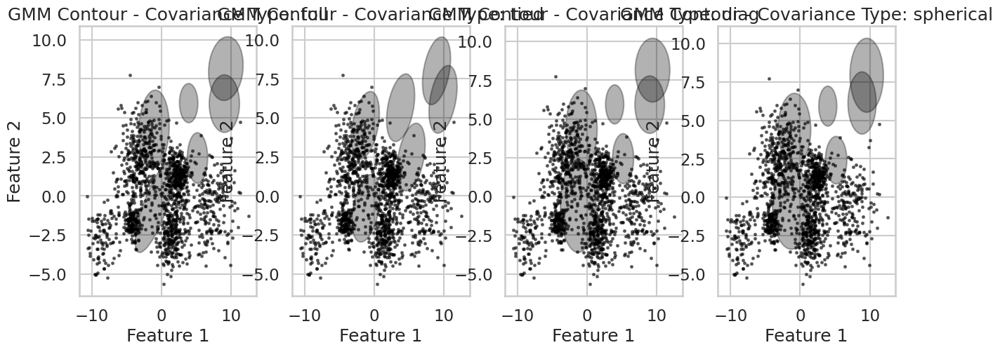

In [87]:
import matplotlib as mpl

def plot_gaussian_ellipse(mean, cov, color, alpha):
    v, w = np.linalg.eigh(cov)
    v = 2.0 * np.sqrt(2.0) * np.sqrt(v)
    u = w[0] / np.linalg.norm(w[0])

    angle = np.arctan(u[1] / u[0])
    angle = 180.0 * angle / np.pi
    ell = mpl.patches.Ellipse(mean, v[0], v[1], 180.0 + angle, color=color, alpha=alpha)
    ell.set_clip_box(plt.gca().bbox)
    ell.set_alpha(alpha)
    plt.gca().add_patch(ell)

# Plot 2D contour for the best GMM model
plt.figure(figsize=(15, 5))
for i, cov_type in enumerate(covariance_types):
    plt.subplot(1, len(covariance_types), i + 1)
    plot_gmm_contour(Multi_blob_Data_pca, gmm_results[cov_type]['model'], f'GMM Contour - Covariance Type: {cov_type}')

plt.show()


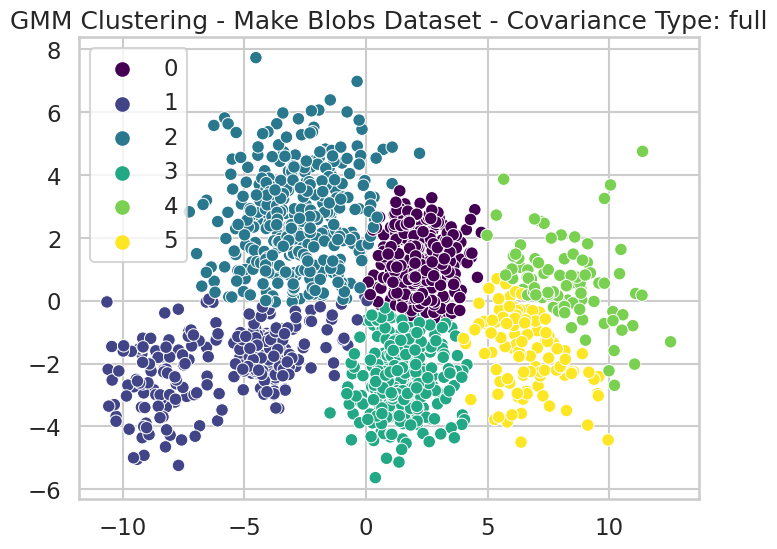

Silhouette Score (full): 0.44513443936241415


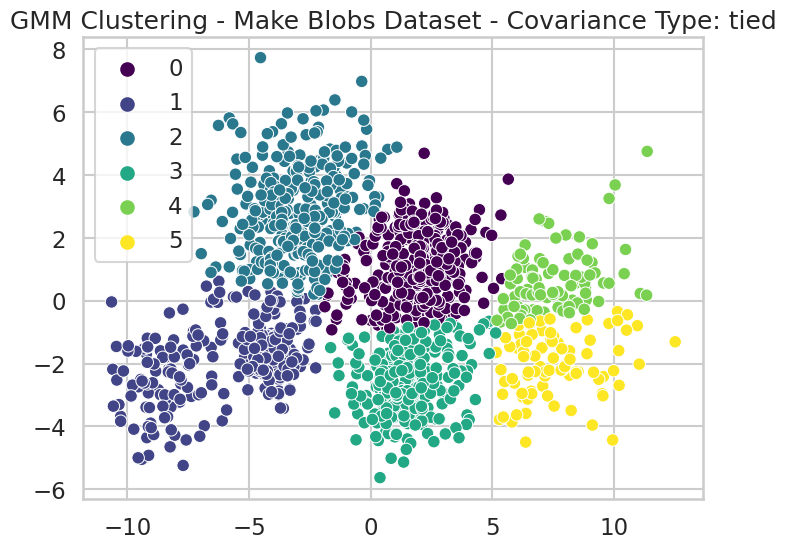

Silhouette Score (tied): 0.4419047609263477


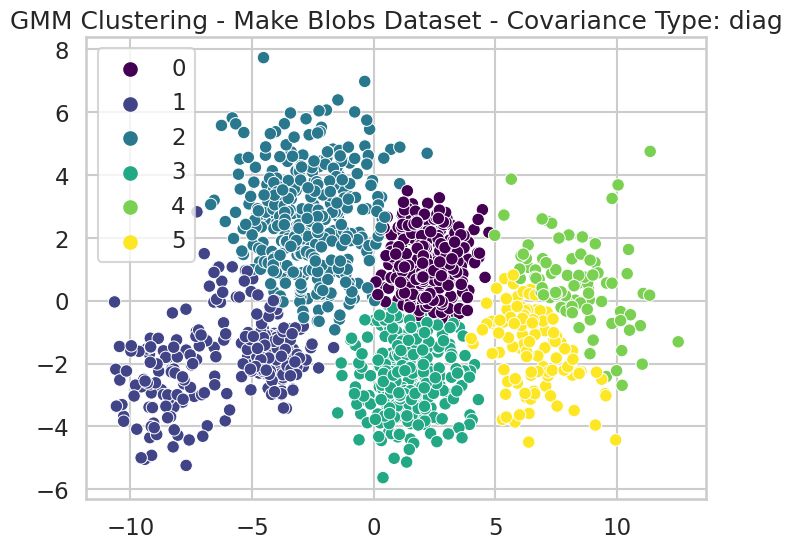

Silhouette Score (diag): 0.45358572472246456


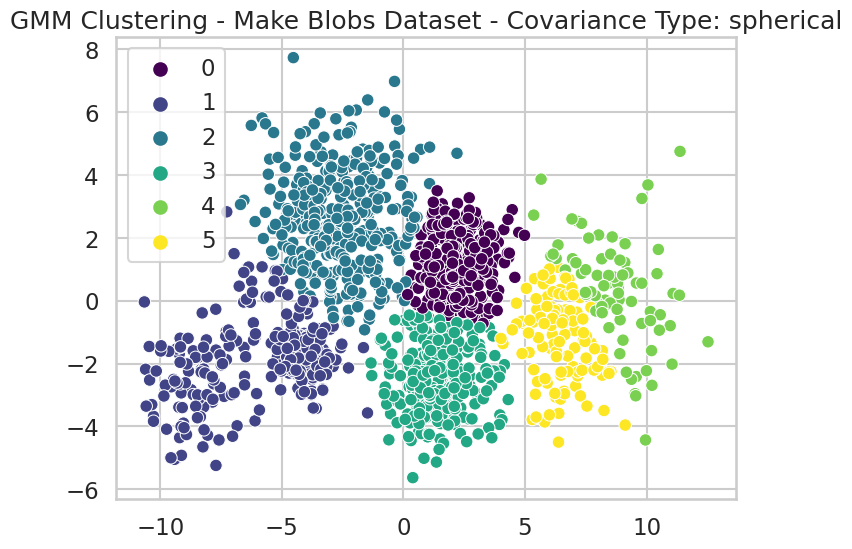

Silhouette Score (spherical): 0.4528823752874064


In [76]:
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Function to apply PCA and GMM clustering
def pca_and_gmm_clustering(data, n_components, covariance_types, dataset_name):
    # Apply PCA
    pca = PCA(n_components=2)
    data_pca = pca.fit_transform(data)

    best_silhouette_score = -1

    for covariance_type in covariance_types:
        # Apply Gaussian Mixture clustering
        gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
        labels = gmm.fit_predict(data)

        # Display GMM clusters
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=data_pca[:, 0], y=data_pca[:, 1], hue=labels, palette='viridis', legend='full')
        plt.title(f'GMM Clustering - {dataset_name} - Covariance Type: {covariance_type}')
        plt.show()

        # Evaluate clustering using silhouette score
        silhouette = silhouette_score(data, labels)
        print(f'Silhouette Score ({covariance_type}): {silhouette}')

        # Update best parameters if silhouette score improves
        if silhouette > best_silhouette_score:
            best_silhouette_score = silhouette
            best_gmm_model = gmm

    return best_gmm_model

# Generate make_blobs dataset
n_bins = 6
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]
Multi_blob_Data, _ = make_blobs(n_samples=[100, 150, 300, 400, 300, 200], n_features=2,
                                cluster_std=[1.3, 0.6, 1.2, 1.7, 0.9, 1.7],
                                centers=centers, shuffle=False, random_state=42)

# Apply PCA and GMM clustering to make_blobs dataset
n_components = 6  # Number of clusters in the dataset
covariance_types = ['full', 'tied', 'diag', 'spherical']
best_gmm_model_blobs = pca_and_gmm_clustering(Multi_blob_Data, n_components, covariance_types, 'Make Blobs Dataset')


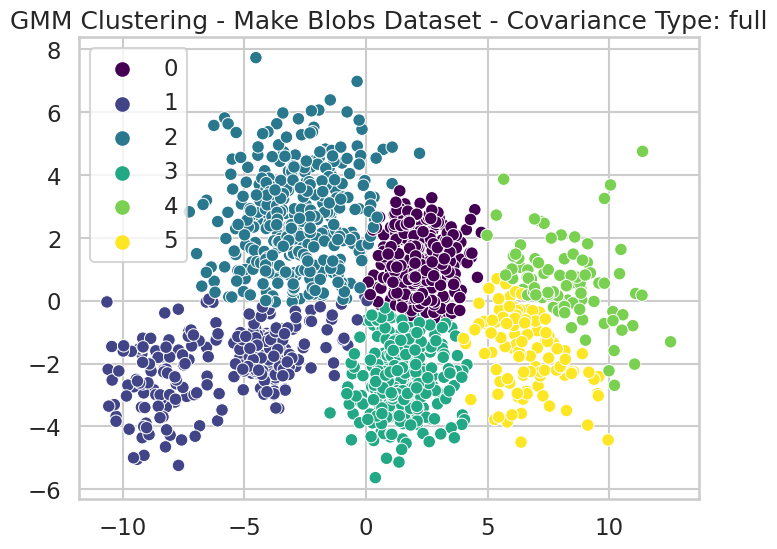

Silhouette Score (full): 0.44513443936241415


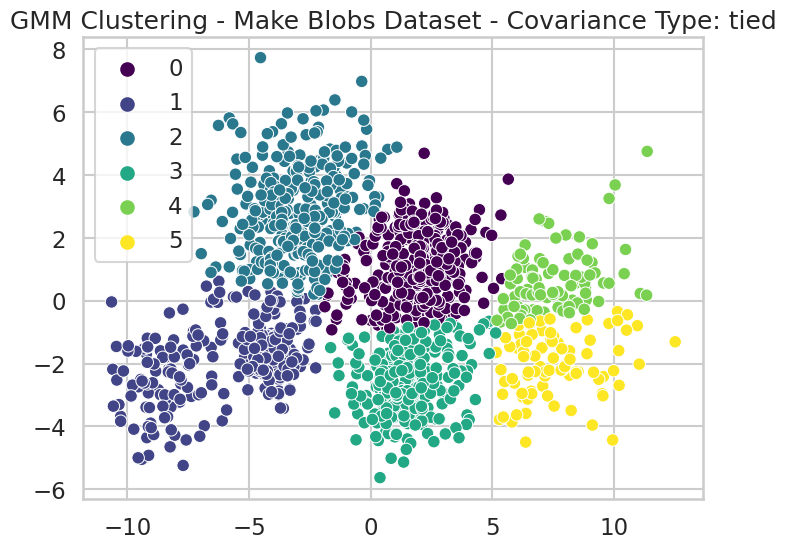

Silhouette Score (tied): 0.4419047609263477


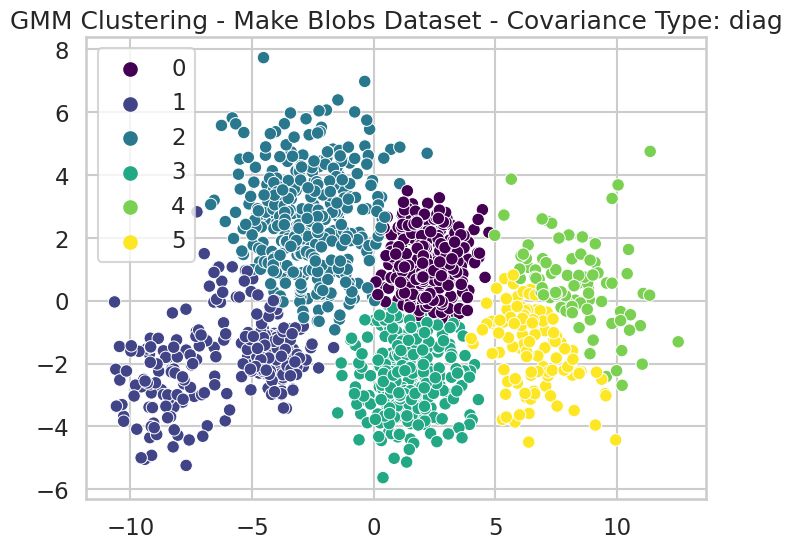

Silhouette Score (diag): 0.45358572472246456


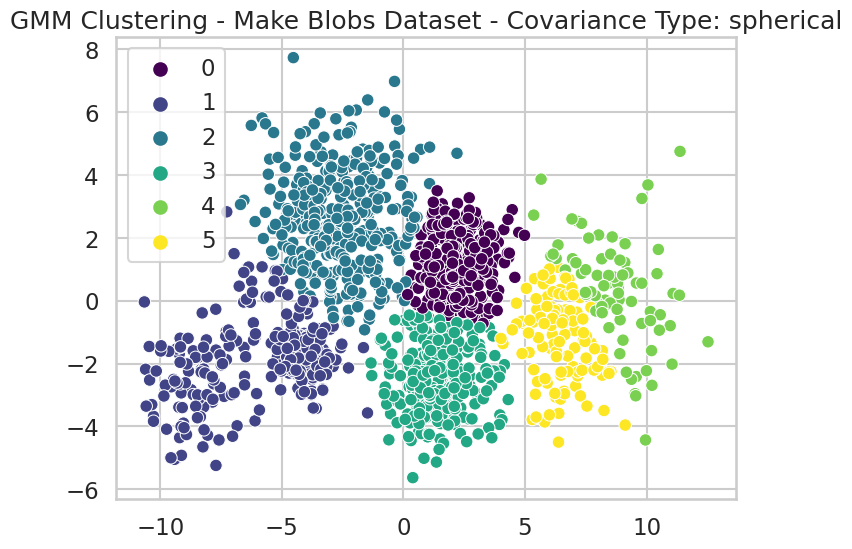

Silhouette Score (spherical): 0.4528823752874064


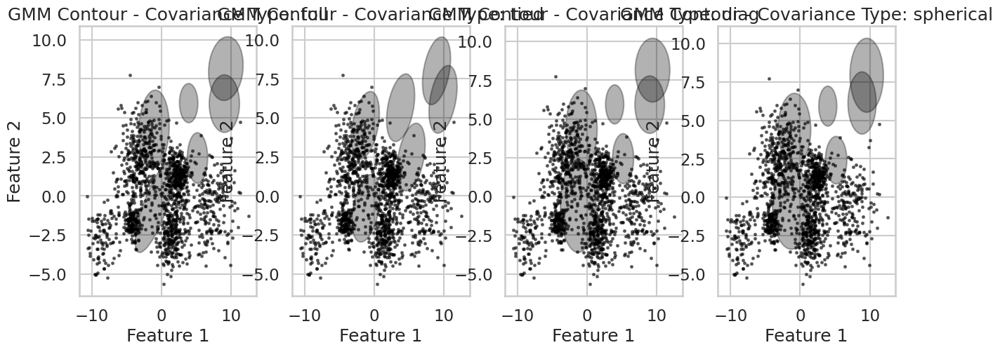

In [77]:
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to apply PCA and GMM clustering
def pca_and_gmm_clustering(data, n_components, covariance_types, dataset_name):
    results = {}
    # Apply PCA
    pca = PCA(n_components=2)
    data_pca = pca.fit_transform(data)

    best_silhouette_score = -1

    for covariance_type in covariance_types:
        # Apply Gaussian Mixture clustering
        gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
        labels = gmm.fit_predict(data)

        # Save GMM results
        results[covariance_type] = {
            'model': gmm,
            'labels': labels,
            'silhouette_score': silhouette_score(data, labels)
        }

        # Display GMM clusters
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=data_pca[:, 0], y=data_pca[:, 1], hue=labels, palette='viridis', legend='full')
        plt.title(f'GMM Clustering - {dataset_name} - Covariance Type: {covariance_type}')
        plt.show()

        print(f'Silhouette Score ({covariance_type}): {results[covariance_type]["silhouette_score"]}')

        # Update best parameters if silhouette score improves
        if results[covariance_type]['silhouette_score'] > best_silhouette_score:
            best_silhouette_score = results[covariance_type]['silhouette_score']
            best_gmm_model = gmm

    return best_gmm_model, data_pca, results

# Generate make_blobs dataset
n_bins = 6
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]
Multi_blob_Data, _ = make_blobs(n_samples=[100, 150, 300, 400, 300, 200], n_features=2,
                                cluster_std=[1.3, 0.6, 1.2, 1.7, 0.9, 1.7],
                                centers=centers, shuffle=False, random_state=42)

# Apply PCA and GMM clustering to make_blobs dataset
n_components = 6  # Number of clusters in the dataset
covariance_types = ['full', 'tied', 'diag', 'spherical']
best_gmm_model_blobs, Multi_blob_Data_pca, gmm_results = pca_and_gmm_clustering(Multi_blob_Data, n_components, covariance_types, 'Make Blobs Dataset')

# Function to plot 2D contour for GMM
def plot_gmm_contour(X, gmm, title):
    plt.scatter(X[:, 0], X[:, 1], s=5, color='black', alpha=0.5)

    for i in range(gmm.n_components):
        if gmm.covariance_type == 'full':
            covariances = gmm.covariances_[i][:2, :2]
        elif gmm.covariance_type == 'tied':
            covariances = gmm.covariances_[:2, :2]
        elif gmm.covariance_type == 'diag':
            covariances = np.diag(gmm.covariances_[i][:2])
        else:
            covariances = np.eye(2) * gmm.covariances_[i]

        plot_gaussian_ellipse(gmm.means_[i][:2], covariances, color='k', alpha=0.3)

    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.grid(True)

# Plot 2D contour for the best GMM model
plt.figure(figsize=(15, 5))
for i, cov_type in enumerate(covariance_types):
    plt.subplot(1, len(covariance_types), i + 1)
    plot_gmm_contour(Multi_blob_Data_pca, gmm_results[cov_type]['model'], f'GMM Contour - Covariance Type: {cov_type}')

plt.show()


## iris data set
The iris data set is test data set that is part of the Sklearn module
is contains a 150 recors each with 4 features all the features are represented by real numbers
The data represents three classes


In [51]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

* repeat all the above clustering approachs and steps on the above data
* normalize the data repeat all the obove steps
* compare between the different clustering approachs

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

def display_clusters(X, labels, title):
    plt.figure(figsize=(8, 8))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='viridis', s=100, alpha=0.7)
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()


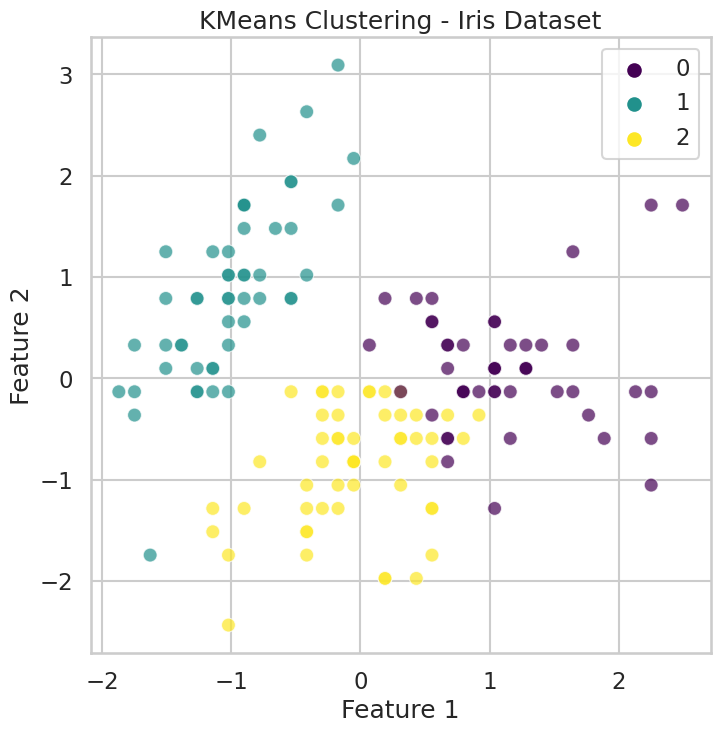

In [54]:
# Section 1: KMeans clustering
# ----------------------------------------------
# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data
iris_target = iris_data.target

# Normalize the data
scaler = StandardScaler()
iris_features_normalized = scaler.fit_transform(iris_features)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(iris_features_normalized)

# Display KMeans clusters
display_clusters(iris_features_normalized, kmeans_labels, 'KMeans Clustering - Iris Dataset')
# ----------------------------------------------


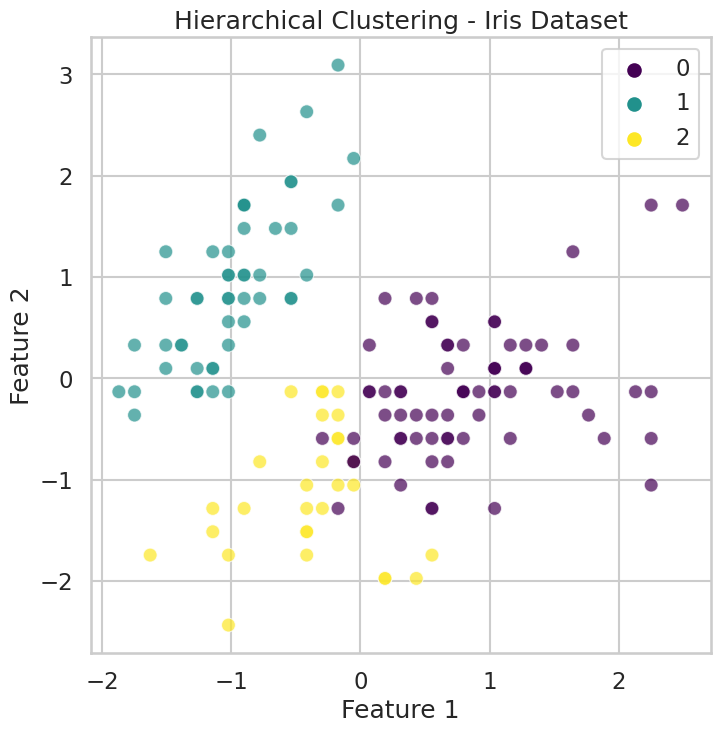

In [55]:
# Section 2: Hierarchical Clustering
# ----------------------------------------------
# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data
iris_target = iris_data.target

# Normalize the data
scaler = StandardScaler()
iris_features_normalized = scaler.fit_transform(iris_features)

# Apply Hierarchical Clustering
hierarchical_model = AgglomerativeClustering(affinity='euclidean', linkage='ward', n_clusters=3)
hierarchical_labels = hierarchical_model.fit_predict(iris_features_normalized)

# Display Hierarchical Clustering clusters
display_clusters(iris_features_normalized, hierarchical_labels, 'Hierarchical Clustering - Iris Dataset')
# ----------------------------------------------


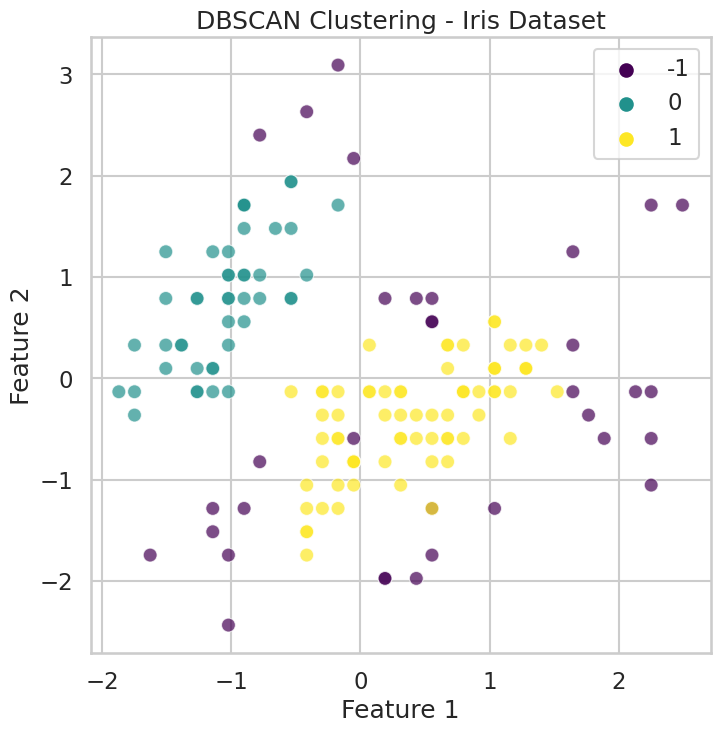

In [56]:
# Section 3: DBSCAN clustering
# ----------------------------------------------
# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data
iris_target = iris_data.target

# Normalize the data
scaler = StandardScaler()
iris_features_normalized = scaler.fit_transform(iris_features)

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(iris_features_normalized)

# Display DBSCAN clusters
display_clusters(iris_features_normalized, dbscan_labels, 'DBSCAN Clustering - Iris Dataset')
# ----------------------------------------------


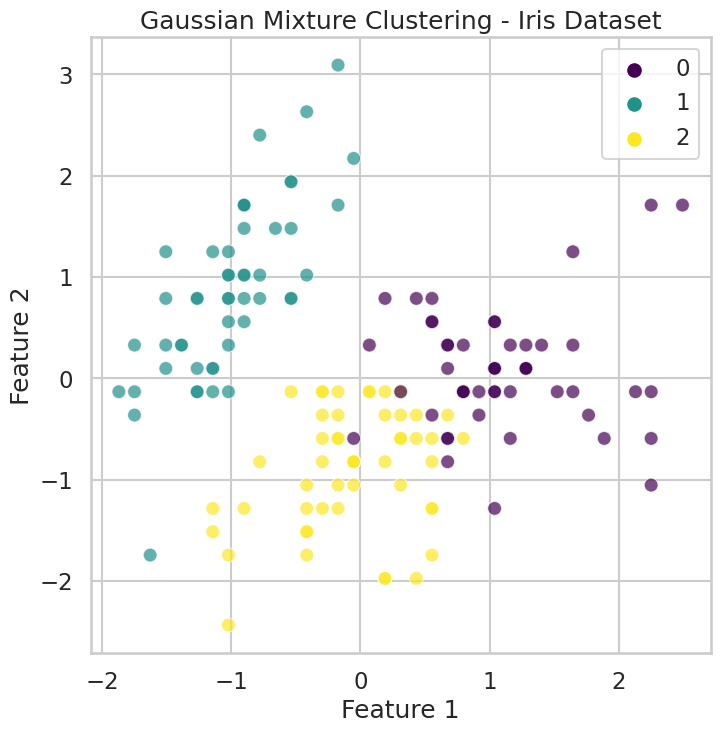

In [57]:
# Section 4: Gaussian Mixture Model clustering
# ----------------------------------------------
# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data
iris_target = iris_data.target

# Normalize the data
scaler = StandardScaler()
iris_features_normalized = scaler.fit_transform(iris_features)

# Apply Gaussian Mixture Model clustering
covariance_types = ['full', 'tied', 'diag', 'spherical']
best_gmm_model = None
best_silhouette_score = -1

# Iterate over covariance types and find the best model
for cov_type in covariance_types:
    gmm = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)
    labels = gmm.fit_predict(iris_features_normalized)
    silhouette = silhouette_score(iris_features_normalized, labels)

    # Update if silhouette score is better
    if silhouette > best_silhouette_score:
        best_silhouette_score = silhouette
        best_gmm_model = gmm

# Display Gaussian Mixture Model clusters
gmm_labels = best_gmm_model.predict(iris_features_normalized)
display_clusters(iris_features_normalized, gmm_labels, 'Gaussian Mixture Clustering - Iris Dataset')
# ----------------------------------------------


## customer dataset
repeat all the above on the custmor dataset